# TP Cuatrimestral - Grupo 2

# Prerrequisitos

In [0]:
!pip install vtk
!pip install itk
!pip install pyhdust

import pyhdust.images as phim
from matplotlib import pyplot as plt
import itk
import vtk
import numpy as np
import skimage
import scipy
from skimage import morphology
from skimage import io, color
from PIL import Image
from os import path
import sklearn
from sklearn.cluster import KMeans
import cv2
import scipy.misc


# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive', force_remount=True)


     |████████████████████████████████| 48.9MB 4.2MB/s 
     |████████████████████████████████| 11.1MB 4.4MB/s 
     |████████████████████████████████| 11.0MB 40.9MB/s 
     |████████████████████████████████| 26.6MB 1.7MB/s 
     |████████████████████████████████| 37.3MB 1.2MB/s 
     |████████████████████████████████| 8.1MB 28.1MB/s 
     |████████████████████████████████| 54.7MB 557kB/s 
     |████████████████████████████████| 28.0MB 1.5MB/s 
  Stored in directory: /root/.cache/pip/wheels/78/ca/cc/b193d7a2944392b11952f43423986dc44e41fdbf418a964219
Successfully built pyhdust
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3Aietf%3Awg%3Aoauth%3A2.0%3Aoob&scope=email%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdocs.test%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive%20https%3A%2F%2Fwww.googleapis.com%2Fauth%2Fdrive.photos.readonly%20https%3A%2F%2Fwww.googleapis.c

# **K-Means de 3 clusters**

El primer paso es realizar una operación de k-means sobre las imágenes para luego ajustar el color de las imágenes y estandarizar el data set. Para esto, primero se visualiza una imagen elegida aleatoriamente, en este caso la Imagen Baso 1. Se puede ver que el globulo blanco se encuentra teñido de violeta, mientras que los glóbulos rojos de un violeta más tenue. Es por esto que aplicar k-means directamente sobre la imágen de color no podrá diferenciar entre glóbulos blancos y rojos.

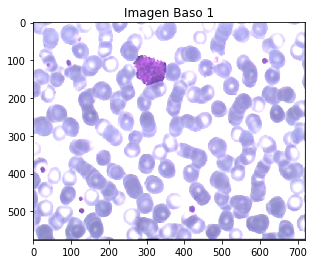

In [0]:
import imageio

pic = imageio.imread('/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/1.bmp')

plt.figure()
plt.imshow(pic)
a = plt.title('Imagen Baso 1')

Entonces, se propone analizar las diferentes capas de la imagen RGB para determinar si la resta entre algunas de las capas o la selección de alguna de ellas permite aplicar k-means a la imagen y separar exitosamente en 3 clusters el glóbulo blanco, los glóbulos rojos y fondo y los núcleos de glóbulos rojos.

Primero, se separan las 3 capas y se visualizan. Se puede ver que el mayor contraste entre glóbulo blanco y glóbulos rojos se encuentra en la capa de intensidades pertenecientes al verde.

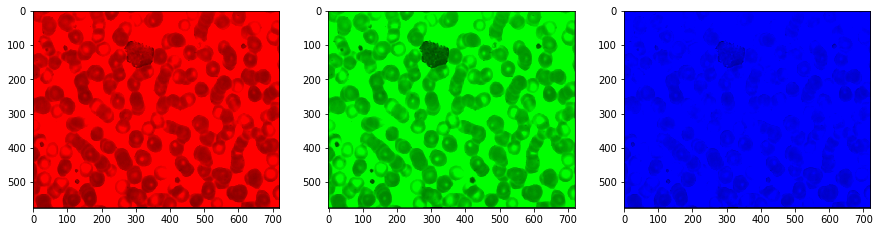

In [0]:
fig, ax = plt.subplots(nrows = 1, ncols=3, figsize=(15,5))

for c, ax in zip(range(3), ax):
    
    # create zero matrix
    split_img = np.zeros(pic.shape, dtype="uint8") # 'dtype' by default: 'numpy.float64'
    
    # assing each channel 
    split_img[ :, :, c] = pic[ :, :, c]
    #display each channel
    ax.imshow(split_img)

Luego, se probó restar las capas 0 y 1 de la imagen, es decir la roja y la verde. Se puede ver que dicha operación también permite diferenciar correctamente glóbulos blancos de rojos, ya que se ven los rojos en blanco, los nucleos y el fondo en negro, y el blanco en gris intermedio. A simple vista, se observa que en la capa verde se puede diferenciar las distintas células.

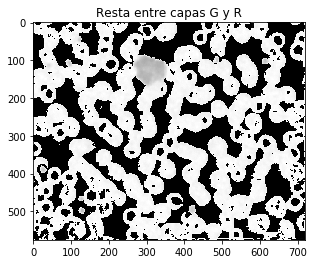

In [0]:
GmenosR=np.zeros((pic.shape[0],pic.shape[1]))
GmenosR=pic[:,:,1]-pic[:,:,0]

plt.figure(0)
plt.imshow(GmenosR,cmap='gray')
a = plt.title('Resta entre capas G y R')

**Funciones**



1.   **ordenarCoordenadas**

Recibe: array de una imagen

Crea una lista, llamada puntos, en la cual introduce las coordenadas de todos los puntos que contiene el array de entrada de a fila, es decir (0,0)(0,1)(0,2)......(1,0)(1,1)(1,2)....

Devuelve: lista con las coordenadas de los puntos ordenadas de a filas
2.   **intensidadesPuntos**

Recibe: la lista de coordenadas de puntos ordenados que devuelve la funcion 1 y el array de la imagen correspondiente

Crea una lista, intensidades, en la que introduce las intensidades en la imagen correspondientes a los puntos en la lista de puntos ordenados.

Devuelve: lista con intensidades que se correponden a los puntos de la lista de puntos ordenados

3. **distancias**

Recibe: lista de coordenadas de los puntos ordenados, lista de las intensidades que corresponden a esos puntos, centroides de los clusters.

En un array llamado distancias que posee tantas filas como la longitud de lista de puntos, es decir tantas filas como puntos haya en la imagen, y 3 columnas (donde la columna 0 corresponde al cluster 1, la columna 1 al cluster 2 y la columna 2 al cluster 3). Para cada punto se obtiene su intensidad y la imagen y se calcula la distancia entre cada uno de los 3 centroides y dicha intensidad, y se las guarda ordenadamente en la fila correspondiente a ese punto.

Devuelve: array distancias

4. **minPorFila**

Recibe: array distancias que devuelve la funcion distancias.

Calcula el minimo de cada fila del array y guarda las posiciones en columna del array de entrada que corresponde al minimo de cada fila. 

Devuelve: una lista con las posiciones columna de minimo por fila

5. **recalcCentroides**

Recibe: una lista de intesidades de cada punto de la imagen y la lista con las posiciones de los minimos por fila

Calcula los nuevos centroides como centros de masa de intensidades.

Devuelve: los valores de los nuevos centroides

6. **kMeans**

Recibe: centroides iniciales, el array de la imagen a analizar y un entero que indica si se quiere o no plotear los resultados directamente (1 si se quiere plotear, otro numero si no)

Realiza k-medias de 3 segmentos para una imagen en escala de grises dada. 

Mientras las etiquetas de los puntos se modifiquen:
1. calcula las distancias de los puntos a los centroides
2. calcula el minimo de las tres distancias para cada punto
3. guarda las etiquetas de los puntos en minimosAnterior
4. incrementa el contador en uno
5. recalcula los centroides

Cuando las etiquetas de los puntos no se modifican en dos iteraciones o alcance un maximo de 1000 iteraciones:

En una matriz de ceros (salida) asigna a cada punto con etiqueta de un mismo cluster, una misma intensidad. Ademas en salida1, salida2 y salida3 asigna valor 1 a los puntos que pertenecen al cluster 1, cluster 2 y cluster 3 respectivamente.

In [0]:
#ordenar los puntos concatenando las filas de las coordenadas como tuplas (0,0),(0,1)......(1,0),(1,1)...
def ordenarCoordenadas(array):
  m = array[:,0].size #filas
  n = array[0].size #columnas
  
  puntos = []
  for i in range(m):
    for j in range(n):
      puntos.append((i,j))
  
  return puntos #me duevuelve una lista con las posiciones en la imagen, concatenadas de a filas

#me devuelve una lista que se corresponde con la lista de coordenadas de puntos, dandome en cada posicion correspondiente la intensidad de la imagen en el punto
def intensidadesPuntos(puntos, array): #le paso una lista de los puntos en donde quiero evaluar el array
  intensidades = []
  l = len(puntos) #cantidad total de puntos
  for j in range(l):
    intensidades.append(array[puntos[j]])
  return intensidades

#cada fila corresponde a un punto en la imagen, segun la lista puntos. para cada punto, calcula las 3 distancias a los centroides.
def distancias(puntos, intensidades, centroides):
  c1 = centroides[0]
  c2 = centroides[1]
  c3 = centroides[2]
  l = len(puntos)
  distancias = np.zeros([l,3])
  
  for j in range(l):
    i = intensidades[j]
    distancias[j,0] = abs(i-c1)
    distancias[j,1] = abs(i-c2)
    distancias[j,2] = abs(i-c3)
  
  return distancias

def minPorFila(distances):
  minimos = np.amin(distances, axis = 1)
  
  posColumnaMinimos = [] #va a tener la coordenada de columna dentro del array de distancias donde se ubica el minimo, para cada fila
  for i in range(distances[:,0].size):
    posicion = np.where(distances[i,:] == minimos[i])
    
    #si llega a pasar que la distancia de un punto a dos centroides o a los tres es igual, elijo por default el centroide dado en la posicion cero
    if(posicion[0].size == 2):
      np.delete(posicion[0],1)
    if(posicion[0].size == 3):
      np.delete(posicion[0],1)
      np.delete(posicion[0],2)
    
    #agrego a la lista la posicion (en columa) del minimo en distancia
    posColumnaMinimos.append(posicion[0][0])
  return posColumnaMinimos

def recalcCentroides(intensidades,posColumnaMinimos): #recalcula los centroides de los clusters obtenidos
  N1 = posColumnaMinimos.count(0) #cantidad de pixels en cluster 1
  N2 = posColumnaMinimos.count(1) #cantidad de pixels en cluster 2
  N3 = posColumnaMinimos.count(2) #cantidad de pixels en cluster 3
  cuno = 0
  cdos = 0
  ctres = 0
  if((N1 == 0) or (N2 == 0) or (N3 == 0)):
    raise Exception('Error: no se encontraron 3 clusters para los centroides iniciales dados')
  for i in range(N1+N2+N3):
    if(posColumnaMinimos[i] == 0):
      cuno += intensidades[i]
    if(posColumnaMinimos[i] == 1):
      cdos += intensidades[i]
    if(posColumnaMinimos[i] == 2):
      ctres += intensidades[i]
  c1 = cuno/N1
  c2 = cdos/N2
  c3 = ctres/N3
  
  centroides = [c1,c2,c3]
  return centroides

def kmeans2(ciniciales,array, plot):
  puntos = ordenarCoordenadas(array)
  intensidades = intensidadesPuntos(puntos,array)
  
  centroidesAnterior = []
  minimosAnterior = []
  centroides = ciniciales
  k = 0 #k cantidad de iteraciones por si queda oscilando
  distances = distancias(puntos,intensidades,centroides)
  columnaDeMinimoPorFila = minPorFila(distances)
  while( (minimosAnterior != columnaDeMinimoPorFila) and k <1000): #limite de iteraciones 100 porque se observo que no suele tardar mas de 20, como demasiado
    
    
    distances = distancias(puntos,intensidades,centroides)
    columnaDeMinimoPorFila = minPorFila(distances) #me devuelve en que columna de distances se encuentra el minimo de cada fila, para cada fila
    
    centroidesAnterior = list(centroides)
    minimosAnterior = list(columnaDeMinimoPorFila)
    centroides = recalcCentroides(intensidades, columnaDeMinimoPorFila)
    k += 1
    distances = distancias(puntos,intensidades,centroides)
    columnaDeMinimoPorFila = minPorFila(distances)
    
  salida = np.zeros([array[:,0].size,array[0].size]) #creo imagen de salida total (cada cluster con intensidad diferente)
  salida1 = np.zeros([array[:,0].size,array[0].size])
  salida2 = np.zeros([array[:,0].size,array[0].size])
  salida3 = np.zeros([array[:,0].size,array[0].size])
  
  for i in range(len(puntos)): #asigno las etiquetas a cada cluster, que resultara en un color diferente para cada uno
    if(minimosAnterior[i]==0): #cluster 1
      salida[puntos[i]] = 10 
      salida1[puntos[i]] = 1
    elif(minimosAnterior[i] == 1): #cluster 2 #blanco
      salida[puntos[i]] = 120  
      salida2[puntos[i]] = 1
    else: #cluster 3 
      salida[puntos[i]] = 250
      salida3[puntos[i]] = 1
      
  print (centroides)
  if(plot == 1):    
    f,ax=plt.subplots(1,4)
    f.set_figheight(8)
    f.set_figwidth(20)
    ax[0].imshow(salida,cmap = 'PiYG')

    ax[1].imshow(salida1, cmap = 'gray')
    ax[1].set_title('Cluster 1')

    ax[2].imshow(salida2, cmap = 'gray')
    ax[2].set_title('Cluster 2')
    
    ax[3].imshow(salida3, cmap = 'gray')
    ax[3].set_title('Cluster 3')
  
  return salida1, salida2, salida3

## **K-means a resta G-R (Basófilos y Eosinófilos)**

Se probó para 3 imágenes de basófilos y 3 de eosinófilos del data set, el resultado de kmeans aplicado a la resta de la capa verde con la roja. Se puede ver que para Basófilos y Eosinófilos los clusters obtenidos logran separar el glóbulo blanco en un cluster, los núcleos de los glóbulos rojos y el fondo en otro, y los citoplasmas de los glóbulos rojos en otro. Esto es exitoso según lo que el paper seleccionado plantea.

[0, 194, 247]
[0, 198, 248]
[0, 196, 249]


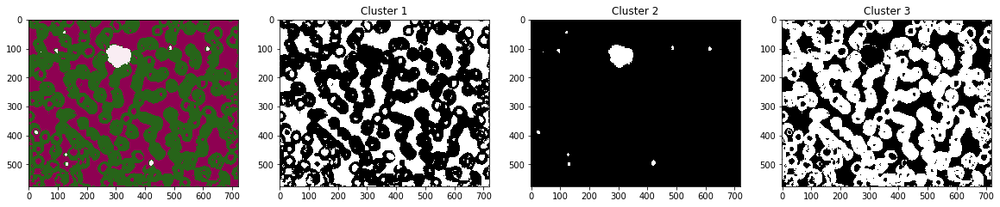

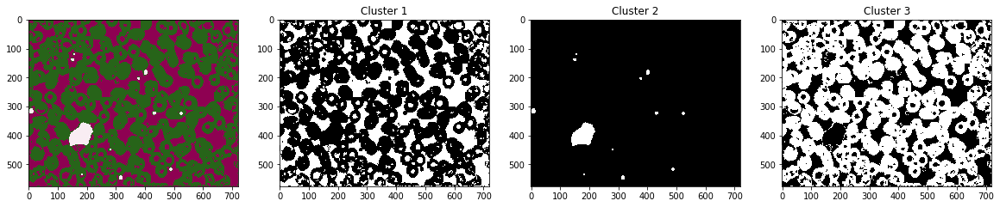

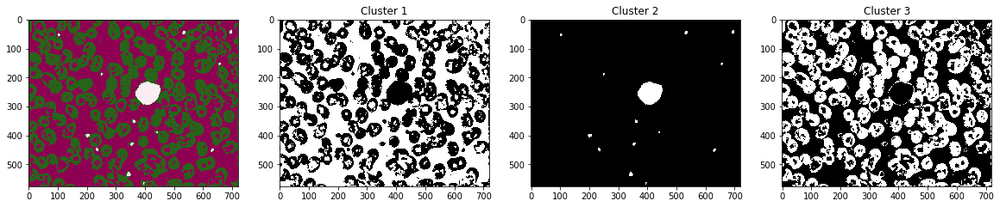

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
lista=list(range(1,4))

for num in lista:
  
  archivo=path.join(path_imagen,str(num)+'.bmp')
  imagen=Image.open(archivo)
  matriz=np.asarray(imagen)
  GmenosR=np.zeros((matriz.shape[0],matriz.shape[1]))
  GmenosR=matriz[:,:,1]-matriz[:,:,0]
  kmeans2([10,150,220],GmenosR, 1)

[0, 188, 247]
[0, 196, 250]
[3, 199, 252]


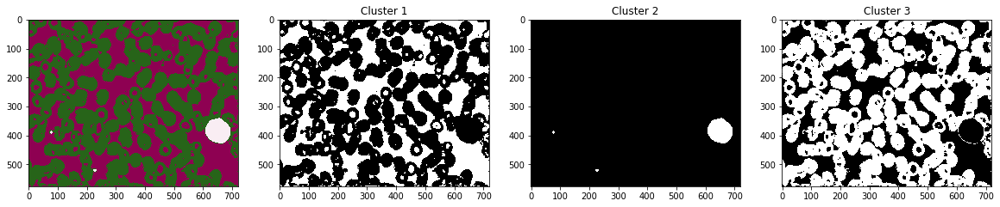

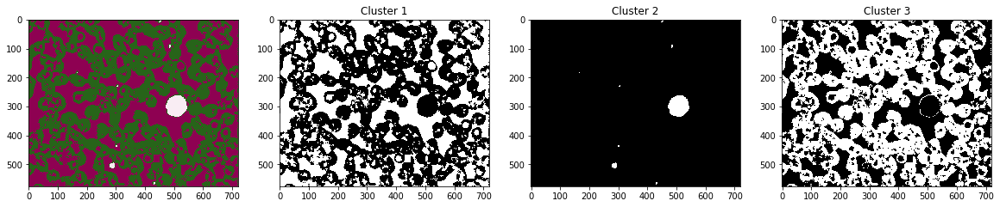

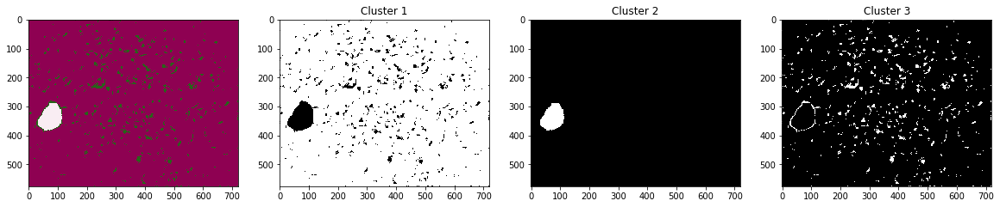

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/eosi/'
lista=list(range(1,4))

for num in lista:
  
  archivo=path.join(path_imagen,str(num)+'.bmp')
  imagen=Image.open(archivo)
  matriz=np.asarray(imagen)
  GmenosR=np.zeros((matriz.shape[0],matriz.shape[1]))
  GmenosR=matriz[:,:,1]-matriz[:,:,0]
  kmeans2([10,150,220],GmenosR, 1)

## K-means a capa G (Basófilos)

Luego, se aplica kmeans a la capa G de 3 imágenes de basófilos para comparar el resultado con lo obtenido con la resta G-R. 

Se puede ver que los resultados entre verde y resta son muy similares, pero que la resta resulta mejor porque en el caso de la capa verde, se segmenta una línea en el inferior de la imagen al glóbulo blanco y, para la imagen baso 3 parece segmentar incorrectamente. Tanto para basófilos como para eosinófilos, para las imágenes testeadas, el método de G-R parece funcionar. 


[91, 174, 248]
[87, 183, 247]
[146, 193, 252]


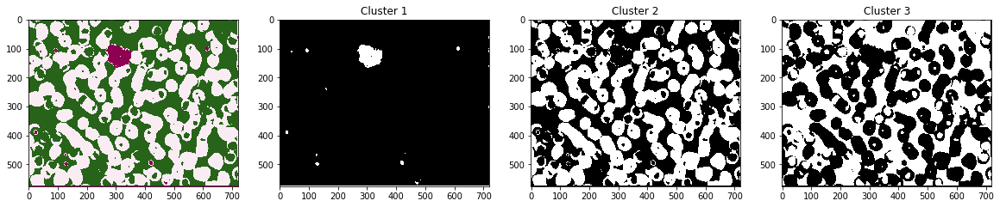

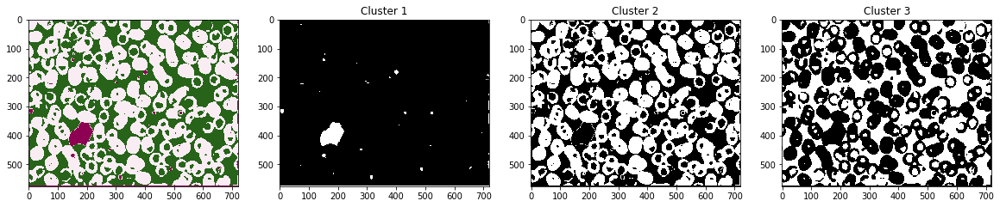

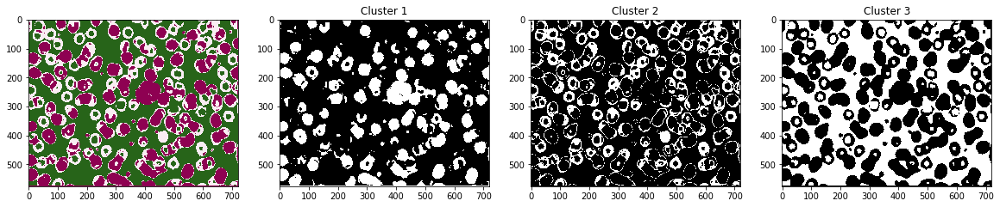

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
lista=list(range(1,4))

for num in lista:
  
  archivo=path.join(path_imagen,str(num)+'.bmp')
  imagen=Image.open(archivo)
  matriz=np.asarray(imagen)
  verde=matriz[:,:,1]
  kmeans2([10,150,220],verde,1 )

## K-means a la resta G-R (Linfocitos)

Para probar que el método funcione para todos los tipos de archivos del data set, primero se visualiza la imagen lymp 1 y las tres capas correspondientes. De entrada, se puede ver que como el color de los glóbulos blancos es más similar aún a los glóbulos rojos (en comparación de los basófilos y eosinófilos), las capas no parecen resaltar la diferencia entre la célula de interés y el resto.

Luego, se realiza kmeans a la resta de las capas G-R para las dos imágenes de linfocitos del data set y dos imágenes mixtas. Se puede ver que el método no logra separar exitosamente los segmentos deseados. Esto presenta un problema ya que el método funciona para basófilos y eosinófilos, pero no para linfocitos y mixtos.


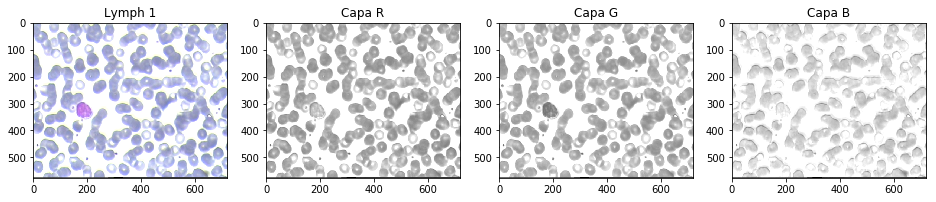

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/lymp/'
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
matriz=np.asarray(imagen)

plt.figure(figsize=(16,16))
plt.subplot(141)
plt.imshow(matriz)
plt.title('Lymph 1')

plt.subplot(142)
plt.imshow(matriz[:,:,0], cmap = 'gray')
plt.title('Capa R')

plt.subplot(143)
plt.imshow(matriz[:,:,1], cmap = 'gray')
plt.title('Capa G')

plt.subplot(144)
plt.imshow(matriz[:,:,2], cmap = 'gray')
a = plt.title('Capa B')

[3, 202, 229]
[3, 196, 227]


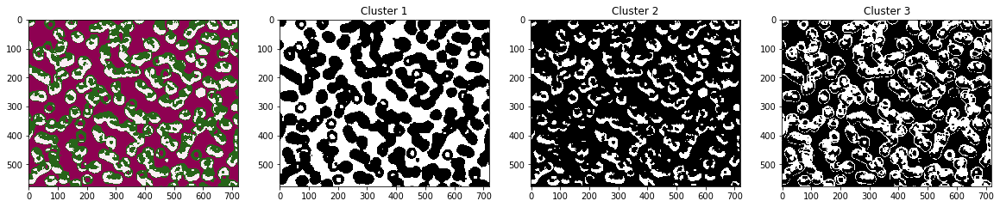

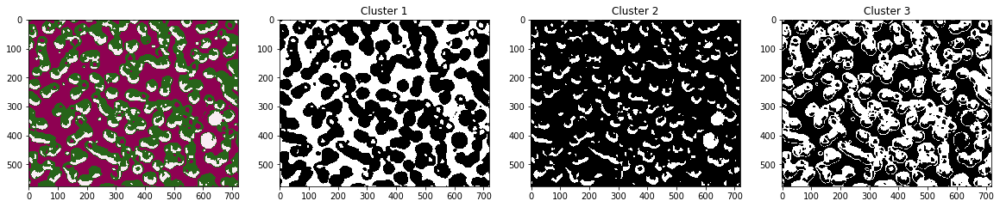

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/lymp/'
lista=list(range(2,4))

for num in lista:
  
  archivo=path.join(path_imagen,str(num)+'.bmp')
  imagen=Image.open(archivo)
  matriz=np.asarray(imagen)
  GmenosR=matriz[:,:,1] - matriz[:,:,2]
  kmeans2([10,150,220],GmenosR, 1)

[0, 200, 240]
[0, 203, 240]


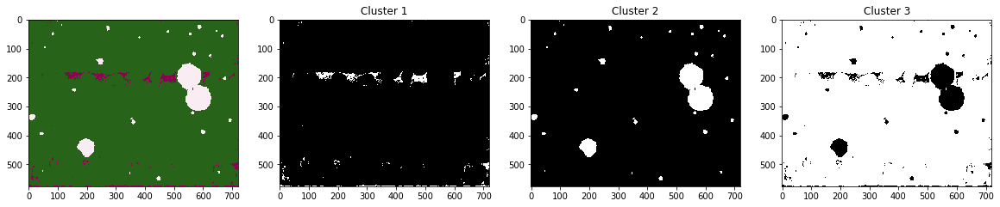

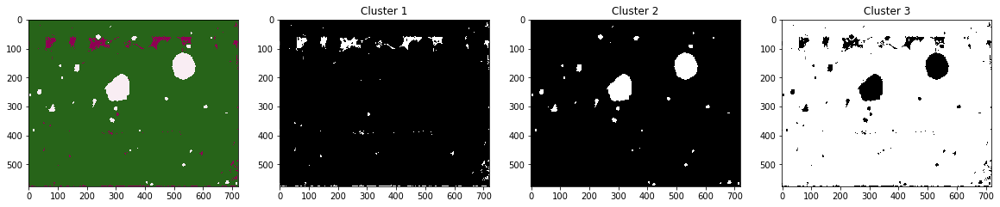

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/mixt/'
lista=list(range(1,3))

for num in lista:
  
  archivo=path.join(path_imagen,str(num)+'.bmp')
  imagen=Image.open(archivo)
  matriz=np.asarray(imagen)
  GmenosR=matriz[:,:,1] - matriz[:,:,0]
  kmeans2([10,150,220],GmenosR, 1)

### Prueba Ecualización de G-R

A modo de solucionar el problema encontrado, se intentó aplicar el método de ecualización de histograma a la resta G-R para poder resaltar mejor el nivel de gris de los glóbulos blancos deseados. A continuación se muestra el resultado obtenido para la imagen lymp 1 y el correspondiente resultado de kmeans. Se puede ver que el procedimiento no resulta exitoso.

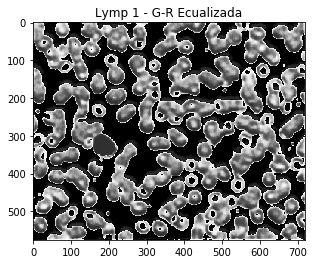

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/lymp/'
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
matriz=np.asarray(imagen)

hist_equalization_result = cv2.equalizeHist(matriz[:,:,1]-matriz[:,:,2])
plt.imshow(hist_equalization_result, cmap = 'gray')
a = plt.title('Lymp 1 - G-R Ecualizada')

[38, 116, 255]


(array([[1., 0., 0., ..., 1., 1., 1.],
        [1., 0., 0., ..., 1., 1., 1.],
        [1., 0., 0., ..., 1., 1., 1.],
        ...,
        [0., 0., 0., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.]]), array([[0., 1., 1., ..., 0., 0., 0.],
        [0., 1., 1., ..., 0., 0., 0.],
        [0., 1., 1., ..., 0., 0., 0.],
        ...,
        [1., 1., 1., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]), array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]))

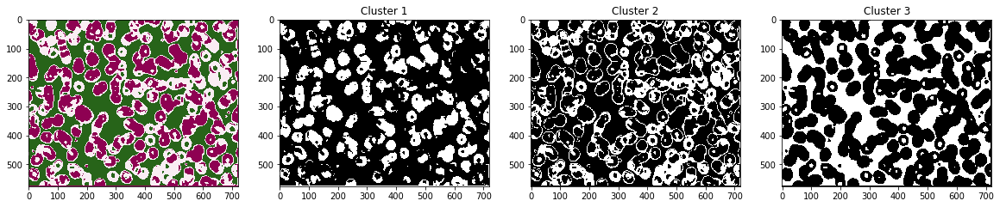

In [0]:
kmeans2([10,90,220],hist_equalization_result, 1)

### Prueba Ecualización YUV

Para la imagen lymp 1, se intentó realizar el ecualizado de la imagen convertida a YUV. Luego, se volvió a convertir la imagen a RGB y se puede ver que la célula es notoriamente mas rosa que el resto. Además, se muestra la resta G-R. Sin embargo, esto tampoco resultó exitoso para la segmentación.



[49, 138, 234]


(array([[1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 0., 1., 1.],
        [1., 1., 1., ..., 0., 1., 1.],
        ...,
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.],
        [1., 1., 1., ..., 1., 1., 1.]]), array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]), array([[0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 1., 0., 0.],
        [0., 0., 0., ..., 1., 0., 0.],
        ...,
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.],
        [0., 0., 0., ..., 0., 0., 0.]]))

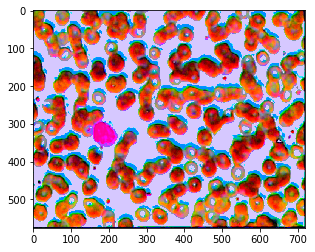

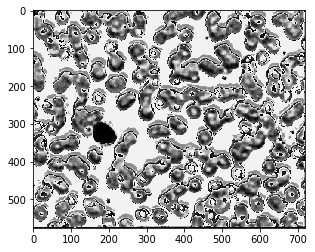

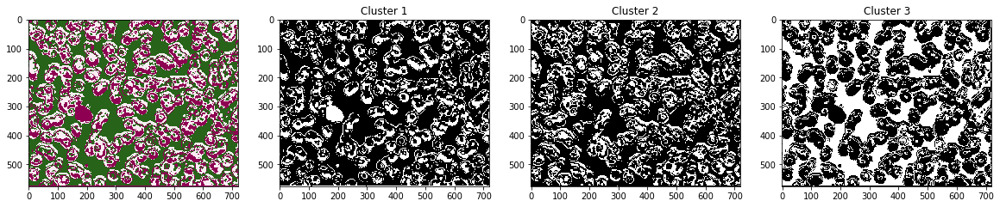

In [0]:
img_to_yuv = cv2.cvtColor(matriz,cv2.COLOR_RGB2YUV)
img_to_yuv[:,:,0] = cv2.equalizeHist(img_to_yuv[:,:,0])
img_to_yuv[:,:,1] = cv2.equalizeHist(img_to_yuv[:,:,1])
img_to_yuv[:,:,2] = cv2.equalizeHist(img_to_yuv[:,:,2])

hist_equalization_result = cv2.cvtColor(img_to_yuv, cv2.COLOR_YUV2BGR)
plt.figure()
plt.imshow(hist_equalization_result)
plt.figure()
plt.imshow(hist_equalization_result[:,:,1]-hist_equalization_result[:,:,0], cmap = 'gray') #G menos B

kmeans2([10,90,220],hist_equalization_result[:,:,1]-hist_equalization_result[:,:,0],1)

# Lab y Ajuste de Color

El paper sugiere primero hacer kmeans y luego ajuste de color de las imágenes. Dado que muchas imágenes poseen tonos similares debido a las tinciones, kmeans no lograba segmentar exitosamente el glóbulo blanco. Entonces, se realiza primero el ajuste de color y luego kmeans para la segmentación. 



---

**ajusteDeColor**

Recibe: imagen a ajustar y una imagen template, ambas en RGB

1. Conversión del template y la imagen original a Lab
2. Se obtiene el valor medio de los planos L, A, B para cada imagen
3. Se obtiene el valor de el desvío estándar de los planos L,A,B para cada imagen
4. Para cada  pixel en la imagen original:
      - se resta la media del plano (de la imagen a ajustar) correspondiente a cada componente (obteniendo l',a',b')
      - se multiplica a cada (l',a',b') por el desvio estandar correspondiente de la imagen template y se la divide por el desvio correspondiente de la imagen original (se obtiene l'',a'',b'')
      - se suma la media del plano de la imagen template a cada l'',a'',b''

Devuelve: imagen ajustada en color al template

In [0]:
def ajusteDeColor(imagenRGB,templateRGB):
  
  template = color.rgb2lab(templateRGB)
  imagen = color.rgb2lab(imagenRGB)
  L = np.mean(imagen[:,:,0])
  A = np.mean(imagen[:,:,1])
  B = np.mean(imagen[:,:,2])
  
  Lt = np.mean(template[:,:,0])
  At = np.mean(template[:,:,1])
  Bt = np.mean(template[:,:,2])
  
  sL = np.std(imagen[:,:,0])
  sA = np.std(imagen[:,:,1])
  sB = np.std(imagen[:,:,2])
  stand = [sL, sA, sB]
  
  sLt = np.std(template[:,:,0])
  sAt = np.std(template[:,:,1])
  sBt = np.std(template[:,:,2])
  standt = [sLt, sAt, sBt]
  
  
  for i in range(imagenRGB.shape[0]):
    for j in range(imagenRGB.shape[1]):
      imagen[i,j,:] = imagen[i,j,:] - (L,A,B)
      
      for k in range(3):
        imagen[i,j,k] = standt[k]*imagen[i,j,k]/float(stand[k])
      
      imagen[i,j,:] = imagen[i,j,:] + (Lt,At,Bt)
  
  return imagen

**Resultados**

Observando las imágenes, se ve que en la resta las capas roja menos verde se resaltan más los glóbulos blancos pero no necesariamente hay 3 clusters, por lo tanto en vez de utilizar kmeans de 3 segmentos se utiliza de 2 (Otsu).

El template elegido para el ajuste de color es la Imagen Baso 1, ya que en los pasos previos la segmentación por kmeans era exitosa. 

In [0]:

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/' 
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
template=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/lymp/'
archivo=path.join(path_imagen,str(3)+'.bmp')
imagen=Image.open(archivo)
matriz2=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
archivo=path.join(path_imagen,str(2)+'.bmp')
imagen=Image.open(archivo)
matriz3=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/neut/'
archivo=path.join(path_imagen,str(2)+'.bmp')
imagen=Image.open(archivo)
matriz4=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/mono/'
archivo=path.join(path_imagen,str(2)+'.bmp')
imagen=Image.open(archivo)
matriz5=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/mixt/'
archivo=path.join(path_imagen,str(2)+'.bmp')
imagen=Image.open(archivo)
matriz6=np.asarray(imagen)

matrices = [matriz2, matriz3, matriz4, matriz5, matriz6]

Color data out of range: Z < 0 in 84 pixels


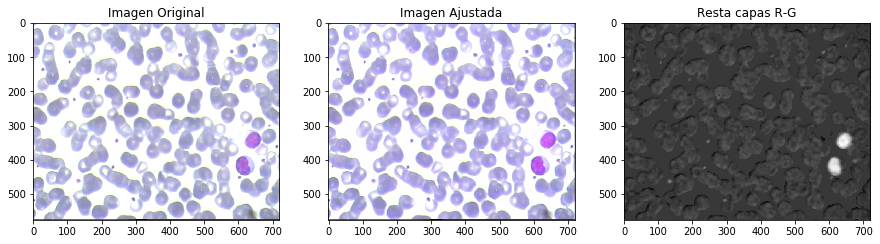

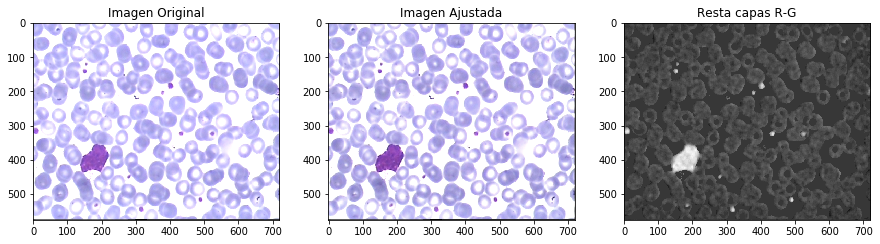

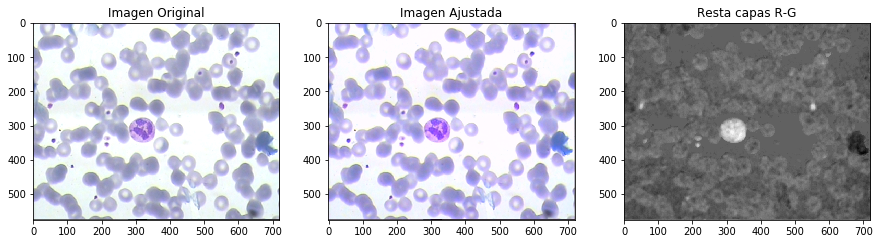

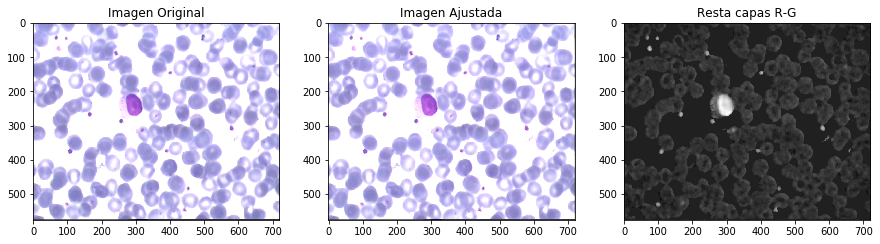

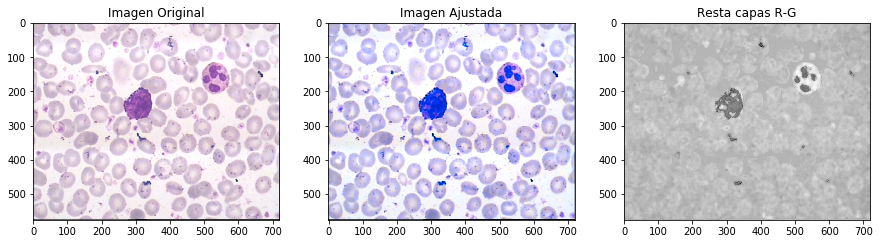

In [0]:
ajustes=[]
for i in range(len(matrices)):
  matriz = matrices[i]
  
  im = ajusteDeColor(matriz, template)
  ajuste = color.lab2rgb(im)
  ajustes.append(ajuste)
  resta = ajuste[:,:,0]-ajuste[:,:,1]
    
  plt.figure(figsize=(15,15))
  plt.subplot(131)
  plt.imshow(matriz)
  plt.title('Imagen Original')
  
  plt.subplot(132)
  plt.imshow(ajuste)
  plt.title('Imagen Ajustada')

  plt.subplot(133)
  plt.imshow(resta, cmap = 'gray') #rojo menos verde
  plt.title('Resta capas R-G')

# Umbralizado: Mascara Total + Sin ruido + Guardado
Se umbraliza la resta R-G de las imagenes con ajuste de color

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/' 
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
template=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIB/Ajuste/lymp/'
archivo=path.join(path_imagen,str(3)+'.png')
imagen=Image.open(archivo)
mat2=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIB/Ajuste/Baso/'
archivo=path.join(path_imagen,str(2)+'.png')
imagen=Image.open(archivo)
mat3=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIB/Ajuste/neut/'
archivo=path.join(path_imagen,str(4)+'.png')
imagen=Image.open(archivo)
mat4=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIB/Ajuste/mono/'
archivo=path.join(path_imagen,str(5)+'.png')
imagen=Image.open(archivo)
mat5=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIB/Ajuste/mixt/'
archivo=path.join(path_imagen,str(4)+'.png')
imagen=Image.open(archivo)
mat6=np.asarray(imagen)

mat = [mat2, mat3, mat4, mat5, mat6]

restas = []

for i in range(len(mat)):
  matriz = mat[i]
  
  im = ajusteDeColor(matriz, template)
  ajuste = color.lab2rgb(im)
  resta = ajuste[:,:,0]-ajuste[:,:,1]
  restas.append(resta)


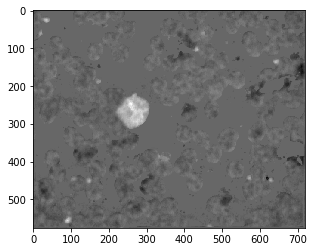

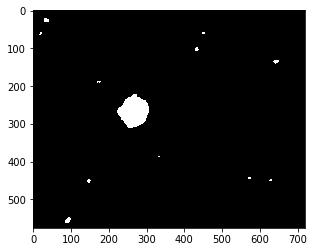

In [0]:
plt.figure(0)
plt.imshow(restas[2], cmap = 'gray')

maximo = np.amax(restas[2])

retval, threshold = cv2.threshold(restas[2], maximo*0.30, maximo, cv2.THRESH_BINARY)
plt.figure(1)
plt.imshow(threshold, cmap = 'gray')

NOTA IMPORTANTE SOBRE GROUND TRUTH:

Las dimensiones de las mascarsa tienen 8 filas y 8 columnas menos que las imagenes originales, se agregan filas y columnas con zero padding (4 de cada lado) para poder compararlas con las mascaras obtenidas experimentales.

Problemas con imagenes de Baso y algunas de Mono que dan oscuras las celulas en vez de claras.

In [0]:
def interseccionDeUnos(array1, array2):
  fil = array1[:,0].size
  col = array1[0].size
  contador = 0
  for i in range(fil):
    for j in range(col):
      if (array1[i,j]==1):
        if(array2[i,j]==1):
          contador += 1
          
  return contador

def cantidadDeUnos(array1):
  fil = array1[:,0].size
  col = array1[0].size
  contador = 0
  for i in range(fil):
    for j in range(col):
      if (array1[i,j]==1):
        contador += 1
  
  return contador
  
def Jaccard(array1, array2):
  interseccion = interseccionDeUnos(array1,array2)
  unosEnArray1 = cantidadDeUnos(array1)
  unosEnArray2 = cantidadDeUnos(array2)
  
  J = float(interseccion)/(unosEnArray1 + unosEnArray2 - interseccion)
  print 'El indice de Jaccard es: ' + str(J)
  return J

def Dice(array1, array2):
  interseccion = interseccionDeUnos(array1,array2)
  unosEnArray1 = cantidadDeUnos(array1)
  unosEnArray2 = cantidadDeUnos(array2)
  
  D = float(2*interseccion)/(unosEnArray1 + unosEnArray2)
  
  print 'El indice de Dice es: ' + str(D)
  return D

def zeroPadding(array, dim): #dim es la cantidad de filas (o columnas) de la mascara cuadrada (dim impar)
  
  fil = array[:,0].size
  col = array[0].size
  a = int((dim-1)/2)
  filSalida = fil+2*a
  colSalida = col+2*a
  
  salidaConPadding = np.zeros([filSalida,colSalida])
  salidaConPadding[a:filSalida-a,a:colSalida-a] = array
  
  return salidaConPadding

def boolToBinary(array):
  fil = array.shape[0]
  col = array.shape[1]
  salida = np.zeros([fil, col])
  for i in range(fil):
    for j in range(col):
      if(array[i,j]==False):
        salida[i,j] = 0
      else:
        salida[i,j] = 1
  salida = salida.astype(int)
  
  return salida

def decisionDeUmbral(Resta):
  h = plt.hist((Resta.copy()).ravel(), bins = 256, density = True)
  g = h[1][128]
  
  if(g<-0.1):
    return 0
  else:
    return 1
  
def binarizar(array):
  fil = array.shape[0]
  col = array.shape[1]
  salida = np.zeros([fil,col])
  
  u = np.unique(array)
  if(u[0]<0 or u[1]<0):
    for i in range(fil):
      for j in range(col):
        if(array[i,j]==0):
          salida[i,j] = 1
  if(u[0]>0 or u[1]>0):
    for i in range(fil):
      for j in range(col):
        if(array[i,j]!=0):
          salida[i,j] = 1

  return salida

## Intento 1

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_template='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/' 
a=str(1)+'.bmp'
archivo=path.join(path_template, a)
imagen=Image.open(archivo)
template=np.asarray(imagen)

directorioentrada='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
directoriosalida='/content/drive/My Drive/PIB/Ajuste/' 
for i in gb:
  for n in range(1,i[1]+1):
    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(n)+'.bmp')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)
    
    A = ajusteDeColor(matriz, template)
    ajuste = color.lab2rgb(A)
    
    path_salida=path.join(directoriosalida,i[0]+ '/'+str(n)+'.png')
    
    scipy.misc.imsave(path_salida,ajuste, format='png')
  

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
Color data out of range: Z < 0 in 92 pixels
Color data out of range: Z < 0 in 83 pixels
Color data out of range: Z < 0 in 65 pixels
Color data out of range: Z < 0 in 63 pixels
Color data out of range: Z < 0 in 101 pixels
Color data out of range: Z < 0 in 78 pixels
Color data out of range: Z < 0 in 79 pixels
Color data out of range: Z < 0 in 95 pixels
Color data out of range: Z < 0 in 70 pixels
Color data out of range: Z < 0 in 71 pixels
Color data out of range: Z < 0 in 108 pixels
Color data out of range: Z < 0 in 25 pixels
Color data out of range: Z < 0 in 533 pixels
Color data out of range: Z < 0 in 1130 pixels
Color data out of range: Z < 0 in 125 pixels
Color data out of range: Z < 0 in 61 pixels
Color data out of range: Z < 0 in 72 pixels
Color data out of range: Z < 0 in 1173 pixels
Color data out of range: Z < 0 in 4 pixels
Color data out of range: Z < 0 

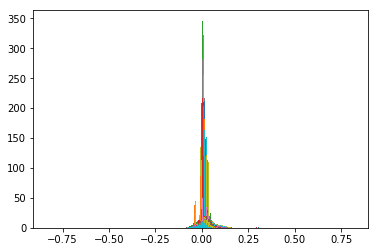

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
template=np.asarray(imagen)

directorioentrada='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
directoriosalida='/content/drive/My Drive/PIB/Mascaras/' 
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
for i in gb:
  for l in range(1,i[1]+1):

    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(l)+'.bmp')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)

    im = ajusteDeColor(matriz, template)
    ajuste = color.lab2rgb(im)
    resta = ajuste[:,:,0]-ajuste[:,:,1]

    if(decisionDeUmbral(resta)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
      minimo = np.amin(resta)
      retval, threshold = cv2.threshold(resta, -0.08, minimo, cv2.THRESH_BINARY)
    else:
      maximo = np.amax(resta)
      retval, threshold = cv2.threshold(resta, maximo*0.30, maximo, cv2.THRESH_BINARY)

    kernel = np.ones([11,11]) 
    c=morphology.binary_closing(binarizar(threshold),kernel) 
    opening = morphology.binary_opening(c,kernel) 

    kernel = np.ones([15,15]) 
    c2=morphology.binary_closing(opening,kernel) 

#     plt.imshow(c2, cmap = 'gray')
#     plt.title('Closing (15x15)')

#     plt.figure()

    kernel = np.ones([29,29]) 
    o1=morphology.binary_opening(opening,kernel) 
#     plt.imshow(o1, cmap = 'gray')
#     plt.title('Opening (29x29)')
    #ojo, hay que correr el opening y closing anterior cada vez porque se modifica la matriz original para el etiquetado

    h = separarCelulas(c2,o1)
#     plt.figure()
#     plt.imshow(h, cmap = 'gray')
    
    path_salida=path.join(directoriosalida,i[0]+ '/'+str(l)+'.png')
    
    scipy.misc.imsave(path_salida,h, format='png')

## Intento 2

In [0]:
def encontrarSeeds(arrayBinario):
  proximaEtiqueta = 2
  filas = arrayBinario[:,0].size
  columnas = arrayBinario[0].size
  arrayEntero = 1*arrayBinario
  contador = 0
  tags = []
  reg = []
  coor = []
  
  for i in range(filas):
    for j in range(columnas):
      if(arrayEntero[i,j] == 1):
        r = etiquetarRegionConexa(arrayEntero, i, j, proximaEtiqueta)
        reg.append(r)
        tags.append(proximaEtiqueta)
        coor.append((i,j))
        proximaEtiqueta +=1
        contador += 1
#         seeds.append([i,j])
#   print("Hay " + str(contador) + " celulas")
  
  return tags,reg, coor
#FUNCION 2
def etiquetarRegionConexa(arrayEntero, i, j, etiqueta):
  stack = []
  contadorpix = 0
  stack.append((i,j))
  filas = arrayEntero[:,0].size
  columnas = arrayEntero[0].size
  while(stack):
    x,y = stack.pop()

    if(x< 0 or y<0 or x>filas-1 or y>columnas-1):
      continue
    if(arrayEntero[x,y] != 1):
      continue
    
    arrayEntero[x,y] = etiqueta
    contadorpix += 1
    stack.append((x+1,y))
    stack.append((x-1,y))
    stack.append((x,y+1))
    stack.append((x,y-1))
  
  return contadorpix
    
def obtenerCelula(arrayEntero, seed):
  stack = []
  i = seed[0]
  j = seed[1]
  stack.append((i,j))
  filas = arrayEntero[:,0].size
  columnas = arrayEntero[0].size
  arraySalida = np.zeros([filas, columnas])
  while(stack):
    x,y = stack.pop()

    if(x< 0 or y<0 or x>filas-1 or y>columnas-1):
      continue
    if(arrayEntero[x,y] != True):
      continue
    
    arrayEntero[x,y] = False
    arraySalida[x,y] = 1
    stack.append((x+1,y))
    stack.append((x-1,y))
    stack.append((x,y+1))
    stack.append((x,y-1))
    
  return arraySalida

def borrarRuido(entrada):
  copia = entrada.copy()
  tags,pix, coor = encontrarSeeds(copia)
  seeds = []
  maximopos = np.argmax(np.asarray(pix))
  maximo = pix[maximopos]
  cells = []
  salida = np.zeros([entrada.shape[0], entrada.shape[1]])
  for i in range(len(tags)):
    if(pix[i]>0.31*maximo):    
      seeds.append(coor[i])
      
  for i in range(len(seeds)):
    cells.append(obtenerCelula(copia,seeds[i]))
    
  for k in range(len(cells)):
    salida += cells[k]
  
  return salida
      

Text(0.5,1,'Mascara Total')

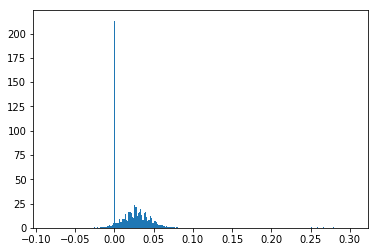

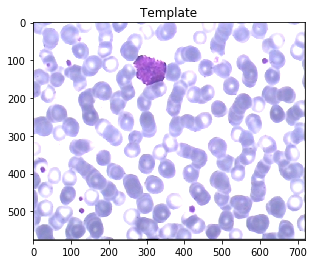

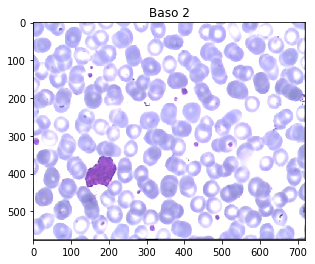

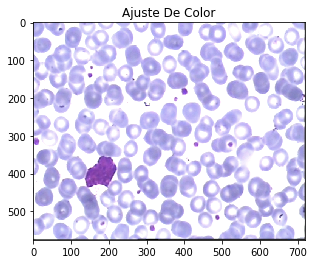

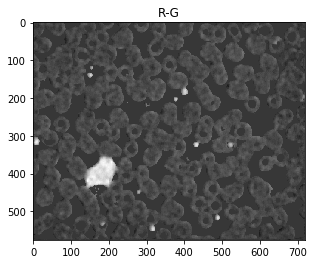

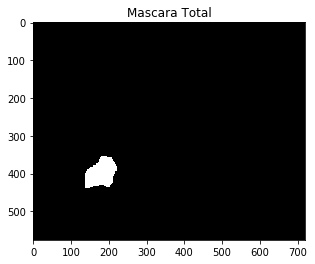

In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
template=np.asarray(imagen)

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
archivo=path.join(path_imagen,str(2)+'.bmp')
imagen=Image.open(archivo)
matriz=np.asarray(imagen)

im = ajusteDeColor(matriz, template)
ajuste = color.lab2rgb(im)
resta = ajuste[:,:,0]-ajuste[:,:,1]

if(decisionDeUmbral(resta)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
  minimo = np.amin(resta)
  retval, threshold = cv2.threshold(resta, -0.08, minimo, cv2.THRESH_BINARY)
else:
  maximo = np.amax(resta)
  retval, threshold = cv2.threshold(resta, maximo*0.30, maximo, cv2.THRESH_BINARY)

kernel = np.ones([11,11]) 
c=morphology.binary_closing(binarizar(threshold),kernel) 
opening = morphology.binary_opening(c,kernel) 

h = borrarRuido(opening)

plt.figure()
plt.imshow(template)
plt.title('Template')

plt.figure()
plt.imshow(matriz)
plt.title('Baso 2')

plt.figure()
plt.imshow(ajuste)
plt.title('Ajuste De Color')

plt.figure()
plt.imshow(resta, cmap ='gray')
plt.title('R-G')

plt.figure()
plt.imshow(h, cmap = 'gray')
plt.title('Mascara Total')




`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


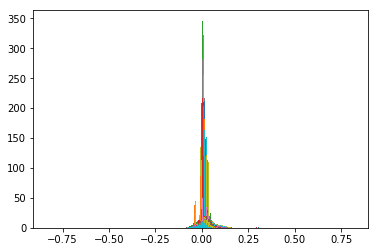

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/'
archivo=path.join(path_imagen,str(1)+'.bmp')
imagen=Image.open(archivo)
template=np.asarray(imagen)

directorioentrada='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
directoriosalida='/content/drive/My Drive/PIB/Mascaras/' 
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
for i in gb:
  for l in range(1,i[1]+1):

    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(l)+'.bmp')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)

    im = ajusteDeColor(matriz, template)
    ajuste = color.lab2rgb(im)
    resta = ajuste[:,:,0]-ajuste[:,:,1]

    if(decisionDeUmbral(resta)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
      minimo = np.amin(resta)
      retval, threshold = cv2.threshold(resta, -0.08, minimo, cv2.THRESH_BINARY)
    else:
      maximo = np.amax(resta)
      retval, threshold = cv2.threshold(resta, maximo*0.30, maximo, cv2.THRESH_BINARY)

    kernel = np.ones([11,11]) 
    c=morphology.binary_closing(binarizar(threshold),kernel) 
    opening = morphology.binary_opening(c,kernel) 
    
    h = borrarRuido(opening)
    

    path_salida=path.join(directoriosalida,i[0]+ '/T'+str(l)+'.png')
    
    scipy.misc.imsave(path_salida,h, format='png')

# Guardado de Mascaras GT: Nucleo, Citoplasma y Total 
Se binarizan las mascaras y se obtienen por separado las de ctoplasma y nucleo (donde corresponda) y la total.

In [0]:
path_template='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Ground Truth Segmentation/mono/areaforexpert1/' 
a=str(4)+'_expert.bmp'
archivo=path.join(path_template, a)
imagen=Image.open(archivo)
mask=np.asarray(imagen)

print np.unique(mask)

[  0 175 200]


In [0]:
def mascarasBinariasCitoNucleo(mask):
  fil = mask.shape[0]
  col = mask.shape[1]
  valores = np.unique(mask)
  nucleo = np.zeros([fil,col])
  citoplasma = np.zeros([fil,col])
  total = np.zeros([fil,col])
  
  if (len(valores) == 2):
    for i in range(fil):
      for j in range(col):
        if (mask[i,j] == valores[1]):
          nucleo[i,j] = 1
          total[i,j] = 1
    return total.astype(int), nucleo.astype(int)
  
  else:
    for i in range(fil):
      for j in range(col):
        if (mask[i,j] == valores[1]):
          citoplasma[i,j] = 1
          total[i,j] = 1
        elif(mask[i,j] == valores[2]):
          nucleo[i,j] = 1
          total[i,j] = 1
    return total.astype(int), nucleo.astype(int), citoplasma.astype(int)

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]
 
directoriosalida='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Ground Truth Segmentation/'
for i in gb:
  for n in range(1,i[1]+1):
     
    a=i[0]+'/'+'areaforexpert1'+'/'+str(n)+'_expert.bmp'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
    
    resultado = mascarasBinariasCitoNucleo(mascara)
    names = ['T','N','C']
    for k in range(len(resultado)):
      name = names[k]
      path_salida=path.join(directoriosalida,i[0]+ '/'+name+str(n)+'.png')
      scipy.misc.imsave(path_salida,resultado[k], format='png')
  

## Mascaras Totales: Dice y Jaccard

In [0]:
def interseccionDeUnos(array1, array2):
  fil = array1[:,0].size
  col = array1[0].size
  contador = 0
  for i in range(fil):
    for j in range(col):
      if (array1[i,j]==255):
        if(array2[i,j]==255):
          contador += 1
          
  return contador

def cantidadDeUnos(array1):
  fil = array1[:,0].size
  col = array1[0].size
  contador = 0
  for i in range(fil):
    for j in range(col):
      if (array1[i,j]==255):
        contador += 1
  
  return contador
  
def Jaccard(array1, array2):
  interseccion = interseccionDeUnos(array1,array2)
  unosEnArray1 = cantidadDeUnos(array1)
  unosEnArray2 = cantidadDeUnos(array2)
  
  J = float(interseccion)/(unosEnArray1 + unosEnArray2 - interseccion)
  print 'El indice de Jaccard es: ' + str(J)
  return J

def Dice(array1, array2):
  interseccion = interseccionDeUnos(array1,array2)
  unosEnArray1 = cantidadDeUnos(array1)
  unosEnArray2 = cantidadDeUnos(array2)
  
  D = float(2*interseccion)/(unosEnArray1 + unosEnArray2)
  
  print 'El indice de Dice es: ' + str(D)
  return D

def zeroPadding(array, dim): #dim es la cantidad de filas (o columnas) de la mascara cuadrada (dim impar)
  
  fil = array[:,0].size
  col = array[0].size
  a = int((dim-1)/2)
  filSalida = fil+2*a
  colSalida = col+2*a
  
  salidaConPadding = np.zeros([filSalida,colSalida])
  salidaConPadding[a:filSalida-a,a:colSalida-a] = array
  
  return salidaConPadding

El indice de Dice es: 0.756659584899


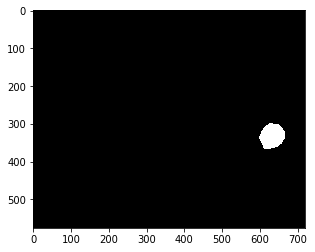

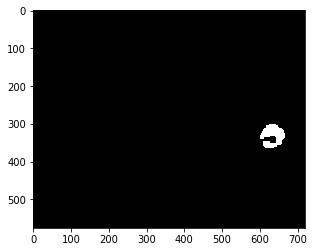

In [0]:
path_exp='/content/drive/My Drive/PIB/Mascaras/Baso/' 

f = 'T40.png'
archivo = path.join(path_exp,f)
imagen=Image.open(archivo)
exp=np.asarray(imagen)

path_template='/content/drive/My Drive/PIB/GT Adaptado/Baso/'
f = 'T40.png' 
archivo = path.join(path_template,f)
imagen=Image.open(archivo)
template=np.asarray(imagen)

temp = zeroPadding(template, 9)




Dice(template, exp)
# Jaccard(template, exp)

plt.imshow(temp, cmap = 'gray')
plt.figure()
plt.imshow(exp, cmap = 'gray')


In [0]:
import csv
RESULTS = [
    ['apple','cherry','orange','pineapple','strawberry']
]
with open("content/drive/My Drive/PIB Sola/output.csv",'w+') as resultFile:
    wr = csv.writer(resultFile, dialect='excel')
    wr.writerows(RESULTS)

IOError: ignored

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50]]

path_template='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_txt = 'content/drive/My Drive/PIB/'
for i in gb:
  c = 'Jaccard' + i[0] + 'T.txt'
  
#   
#   p = path.join(path_txt,c)
  texto = open(c,'w')
  metrics = []
  for n in range(1,i[1]+1):
     
    a=i[0]+'/T'+str(n)+'.png'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
#     print archivo
    b = i[0] + '/T'+str(n)+'.png'
    archivo = path.join(path_template,b)
    imagen = Image.open(archivo)
    template = np.asarray(imagen)
#     print archivo
    
    temp = zeroPadding(template, 9)
    
#     d = Dice(temp, mascara)
    j = Jaccard(temp, mascara)
#     plt.figure()
#     plt.imshow(temp, cmap = 'gray')
#     plt.figure()
#     plt.imshow(mascara, cmap = 'gray')
    
  
    s = str(j) 
    metrics.append(s)
  texto.writelines(["%s\t" % item  for item in metrics])
  texto.close()

  

El indice de Jaccard es: 0.903231471725
El indice de Jaccard es: 0.900272161742
El indice de Jaccard es: 0.931455230576
El indice de Jaccard es: 0.834772727273
El indice de Jaccard es: 0.89604519774
El indice de Jaccard es: 0.122793313545
El indice de Jaccard es: 0.608335659131
El indice de Jaccard es: 0.743522893922
El indice de Jaccard es: 0.624266936299
El indice de Jaccard es: 0.885902876002
El indice de Jaccard es: 0.890566037736
El indice de Jaccard es: 0.900026874496
El indice de Jaccard es: 0.639453335731
El indice de Jaccard es: 0.841162943495
El indice de Jaccard es: 0.932060895251
El indice de Jaccard es: 0.0
El indice de Jaccard es: 0.932018209408
El indice de Jaccard es: 0.0938305891688
El indice de Jaccard es: 0.934266585514
El indice de Jaccard es: 0.934407625965
El indice de Jaccard es: 0.870794879428
El indice de Jaccard es: 0.904481517828
El indice de Jaccard es: 0.835339263911
El indice de Jaccard es: 0.918999728187
El indice de Jaccard es: 0.680279537017
El indice d

In [0]:
open('content/drive/My Drive/PIB/DiceBaso.txt', 'w')

IOError: ignored

# Guardado de imagenes de Ajuste

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_template='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/' 
a=str(1)+'.bmp'
archivo=path.join(path_template, a)
imagen=Image.open(archivo)
template=np.asarray(imagen)

directorioentrada='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/' 
directoriosalida='/content/drive/My Drive/PIB/Ajuste/' 
for i in gb:
  for n in range(1,i[1]+1):
    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(n)+'.bmp')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)
    
    A = ajusteDeColor(matriz, template)
    ajuste = color.lab2rgb(A)
    
    path_salida=path.join(directoriosalida,i[0]+ '/'+str(n)+'.png')
    
    scipy.misc.imsave(path_salida,ajuste, format='png')
  
  
    

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.
Color data out of range: Z < 0 in 87 pixels
Color data out of range: Z < 0 in 76 pixels
Color data out of range: Z < 0 in 219 pixels
Color data out of range: Z < 0 in 91 pixels
Color data out of range: Z < 0 in 57 pixels
Color data out of range: Z < 0 in 93 pixels
Color data out of range: Z < 0 in 82 pixels
Color data out of range: Z < 0 in 88 pixels
Color data out of range: Z < 0 in 877 pixels
Color data out of range: Z < 0 in 58 pixels
Color data out of range: Z < 0 in 75 pixels
Color data out of range: Z < 0 in 90 pixels
Color data out of range: Z < 0 in 1158 pixels
Color data out of range: Z < 0 in 1169 pixels
Color data out of range: Z < 0 in 1293 pixels
Color data out of range: Z < 0 in 1139 pixels
Color data out of range: Z < 0 in 1172 pixels
Color data out of range: Z < 0 in 1189 pixels
Color data out of range: Z < 0 in 1164 pixels
Color data out of rang

# Segmentación de Glóbulos Rojos y Núcleos



In [0]:
path_imagen='/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/' 
archivo=path.join(path_imagen, str(1)+'.bmp')
imagen=Image.open(archivo)
matriz=np.asarray(imagen)

In [0]:
def rgb_to_cmyk(matriz):
  salida = np.zeros((matriz.shape[0], matriz.shape[1], 4))
  for i in range(matriz.shape[0]):
    for j in range(matriz.shape[1]):

      c = 1 - matriz[i,j,0] /255.
      m = 1 - matriz[i,j,1] /255.
      y = 1 - matriz[i,j,2] /255.

      min_cmy = min(c, m, y)
      if min_cmy!=1:
        c = (c - min_cmy) / (1 - min_cmy)
        m = (m - min_cmy) / (1 - min_cmy)
        y = (y - min_cmy) / (1 - min_cmy)
        k = min_cmy
      
      salida[i,j,:] = (c,m,y,k) 

  return salida

1.0
0.0
[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [5.         5.         5.         ... 4.90384615 4.90384615 4.90384615]]


Text(0.5,1,'K')

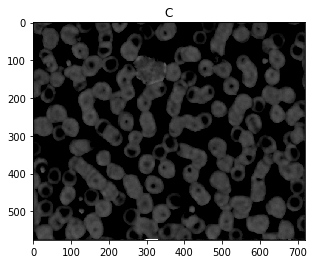

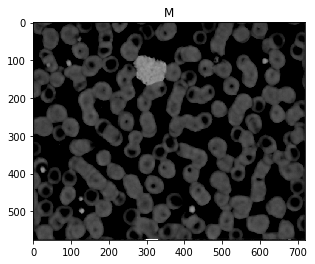

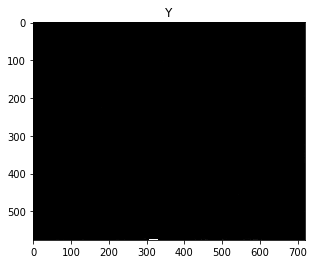

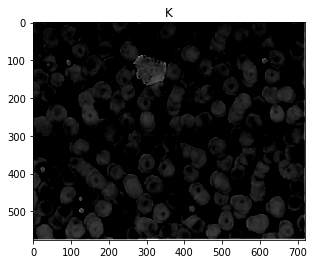

In [0]:
#matrices = [matriz2, matriz3, matriz4, matriz5, matriz6]
matrices=[matriz]
cmyk_transformadas=[]
for i in matrices:
  cmyk_transformadas.append(rgb_to_cmyk(i))

j = rgb_to_cmyk(matriz)

plt.figure()
plt.imshow(j[:,:,0], cmap = 'gray')
plt.title('C')

plt.figure()
plt.imshow(j[:,:,1], cmap = 'gray')
plt.title('M')
print(np.amax(j[:,:,1]))
print(np.amin(j[:,:,1]))

plt.figure()
plt.imshow(j[:,:,2]*255, cmap = 'gray')
plt.title('Y')
print(j[:,:,2]*255)
plt.figure()
plt.imshow(j[:,:,3], cmap = 'gray')
plt.title('K')



Text(0.5,1,'G-R')

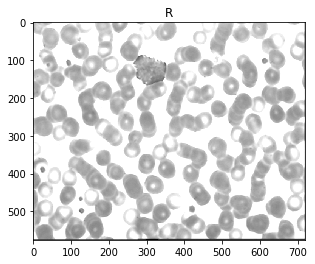

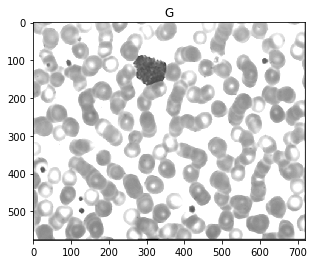

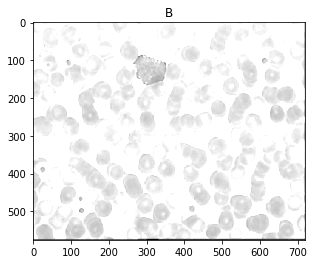

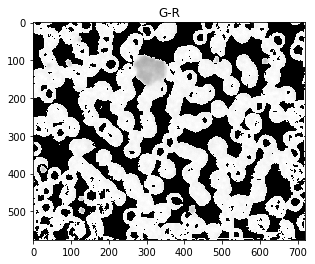

In [0]:
plt.figure()
plt.imshow(matriz[:,:,0], cmap = 'gray')
plt.title('R')

plt.figure()
plt.imshow(matriz[:,:,1], cmap = 'gray')
plt.title('G')

plt.figure()
plt.imshow(matriz[:,:,2], cmap = 'gray')
plt.title('B')

plt.figure()
plt.imshow(matriz[:,:,1]-matriz[:,:,0], cmap = 'gray')
plt.title('G-R')



[0.5351404588834417, 0.2516223533145849, 0.015745175516238514]


AttributeError: ignored

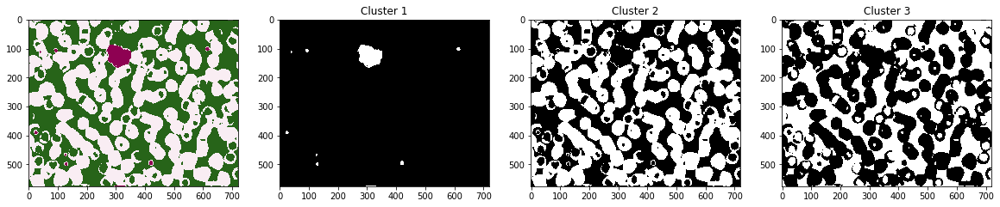

In [0]:
#Se puede notar como en la seccion G se distingue con mayor facilidad el globulo rojo
#Se realiza kmeans a la capa G.
kmeansMulti=[]
for i in matrices:
  mat=i
  kmeansMulti.append(kmeans2([1,0.5,0],j[:,:,1],1))
#kmeans=kmeans2([10,90,220],matriz[:,:,1],0)
#En el cluster 1 se puede ver representado al globulo blanco  

In [0]:
#quiero quedarme con los globulos rojos para le extraigo el globulo rojo a la capa verde de RGB. lo mismo hago con la capa M
def extraer(imagen,paternAExtraer,value):
  out=np.array(imagen)
  f=len(paternAExtraer[0])
  c=len(paternAExtraer)
  for i in range(f):
    for c in range(c):
      if paternAExtraer[i][c]==1.0:
        out[i][c]=value
  return out

for i in range(len(matrices)):
  image=matrices[i]
  extract=cmyk_transformadas[i]
  km=kmeansMulti[i]
  outG=extraer(image[:,:,1],km[0],255)
  outM=extraer(extract[:,:,1],km[0],0)
  
  plt.figure()
  plt.imshow(outG,cmap='gray')
  plt.title('G-globulo blanco')
  #outMorf=morphology.binary_opening(kmeans[0],((1,1,1),(1,1,1),(1,1,1))).astype(np.int)   
  plt.figure()
  plt.imshow(outM,cmap='gray')
  plt.title('M-globulo blanco')



In [0]:
img1 = Image.open('/content/drive/My Drive/PIBM_2019_1C/TP Cuatrimestral/Dataset/Main Dataset/Baso/1.bmp')
img1RGB = img1.convert(mode='RGB')
img1RGBa = np.asarray(img1RGB)
img1CMYK = phim.rgb2cmyk(np.asarray(img1RGB))

mutante = np.zeros((img1RGBa.shape[0], img1RGBa.shape[1],2))
mutante[:,:,0] = img1RGBa[:,:,2]
mutante[:,:,1] = img1CMYK[:,:,2]

def concatenar(array): #va a meter las proyecciones en un vector columna 1D 
  cantidadAngulos = array.shape[1]
  filas = array.shape[0]
  salida = np.zeros([cantidadAngulos*filas])
  
  for i in range(cantidadAngulos):
    salida[filas*i:filas*(i+1)] = array[:,i]
  
  return salida 

def combine(b,y): #quiero combinar aquellas que no tienen nucleos
  f=len(b[0])
  c=len(b)
  out=np.zeros_like(b)
  for f in range(f):
    for c in range(c):
      out[f][c]=b[f][c]+y[f][c]
  return out

Bconcatenado = concatenar(mutante[:,:,0])
Yconcatenado = concatenar(mutante[:,:,1])
features = np.zeros((len(Bconcatenado),2))
features[:,0] = Bconcatenado
features[:,1] = Yconcatenado


invalid value encountered in divide
invalid value encountered in divide
invalid value encountered in divide


# **Segmentación de Núcleos**

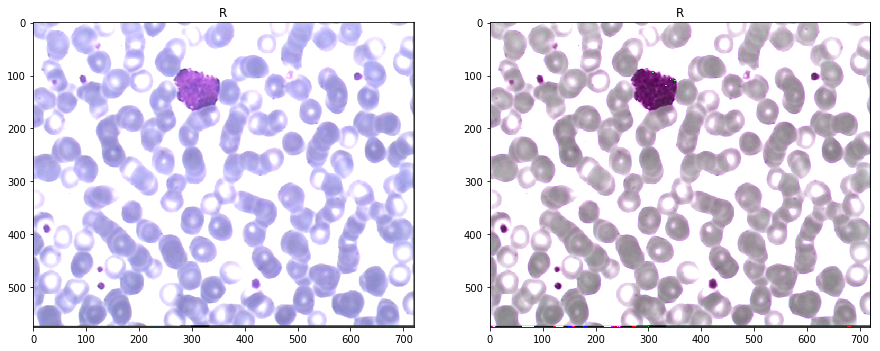

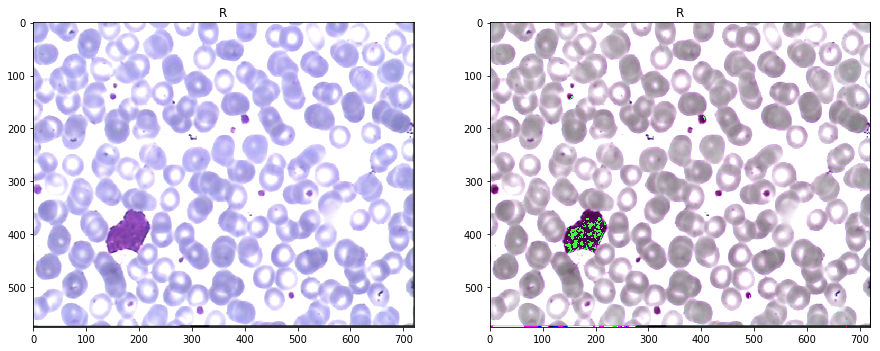

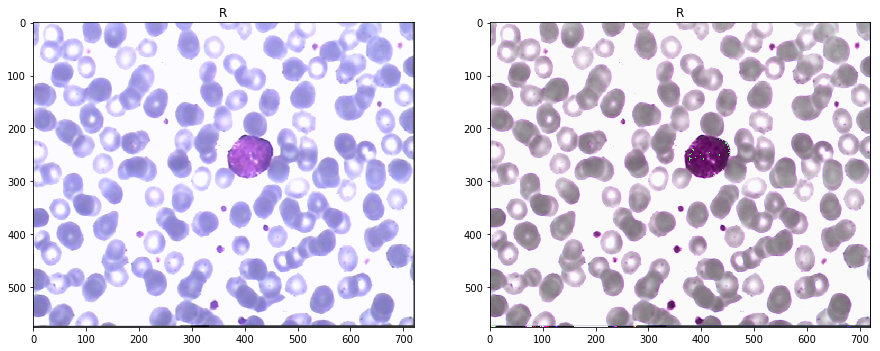

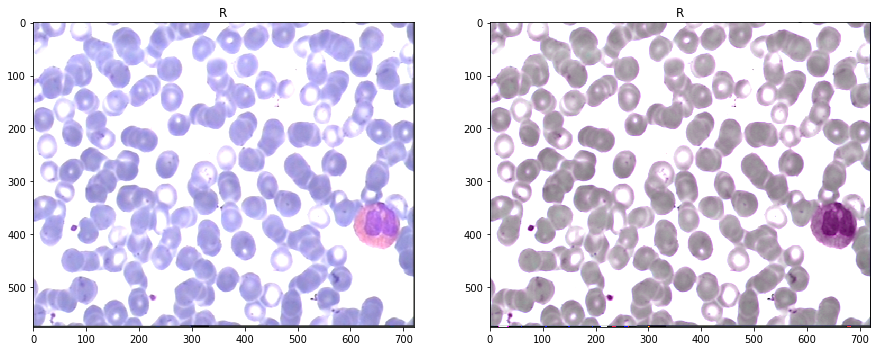

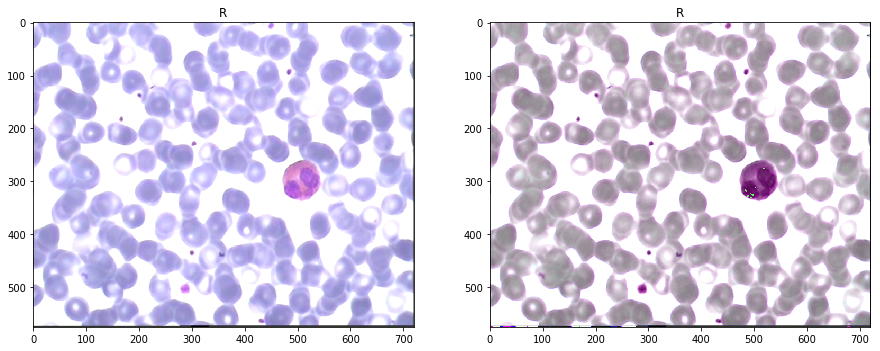

...

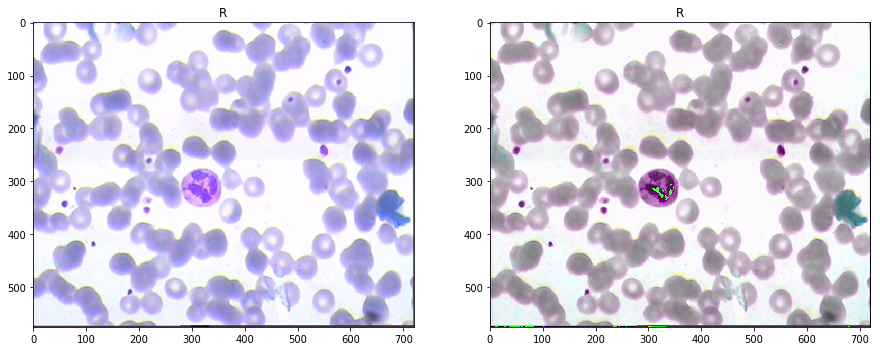

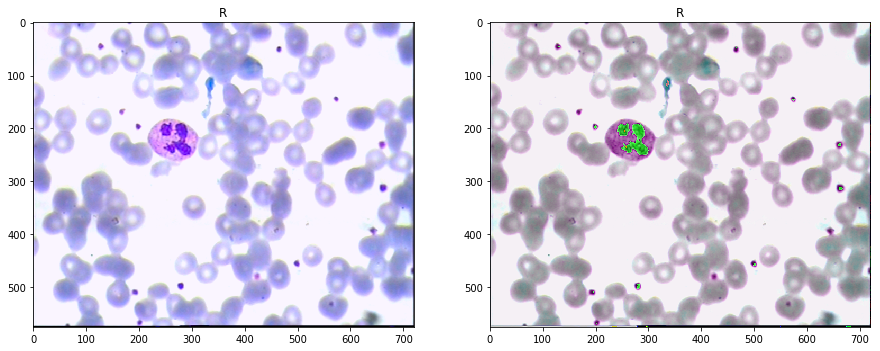

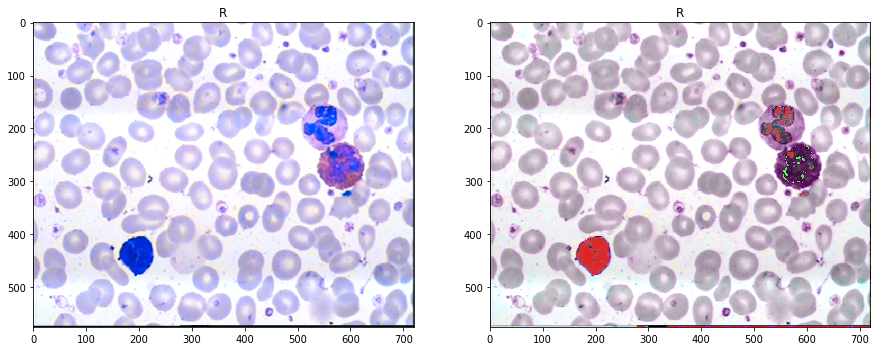

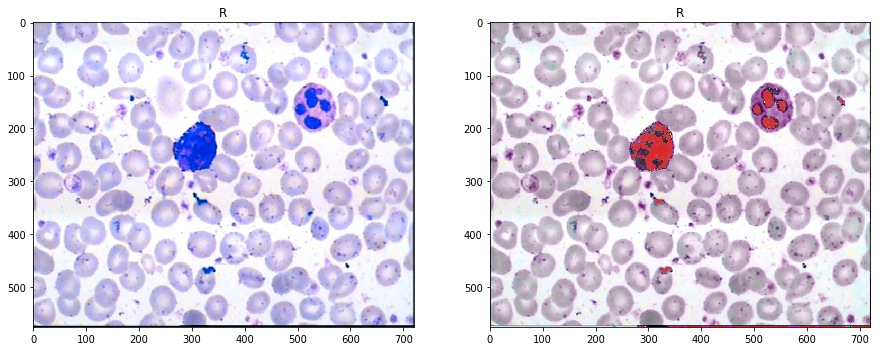

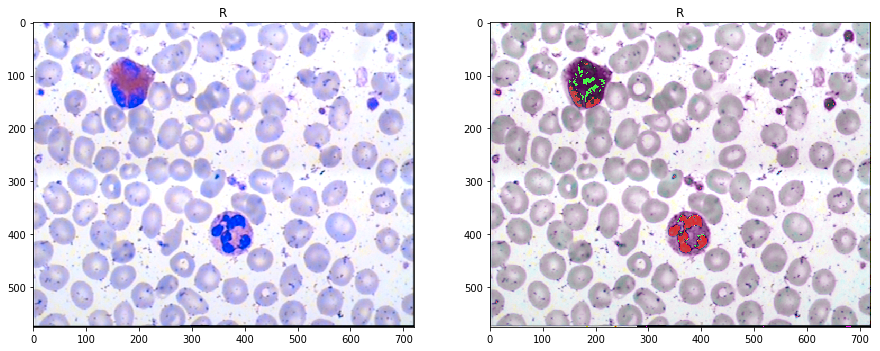

In [0]:
gb=[['Baso',3],['eosi',3],['lymp',2],['mono',3],['neut',3],['mixt',3]]

directorioentrada='/content/drive/My Drive/PIB/Ajuste/' 
enhanced=[]
for i in gb:
  for n in range(1,i[1]+1):
    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(n)+'.png')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)
    
    ajuste=matriz
    opening=morphology.opening(ajuste)
    tophat=ajuste-opening

    closing=morphology.closing(ajuste)
    bothat=ajuste-closing

    I=ajuste+bothat-tophat
    enhanced.append(I)

    f, ax = plt.subplots(1, 2)
    f.set_figheight(15)
    f.set_figwidth(15)

    ax[0].imshow(ajuste)
    ax[0].set_title('R')
    
    ax[1].imshow(I)
    ax[1].set_title('R')
  
    


Se observan los resultados de las imágenes enhanced en sus componentes.

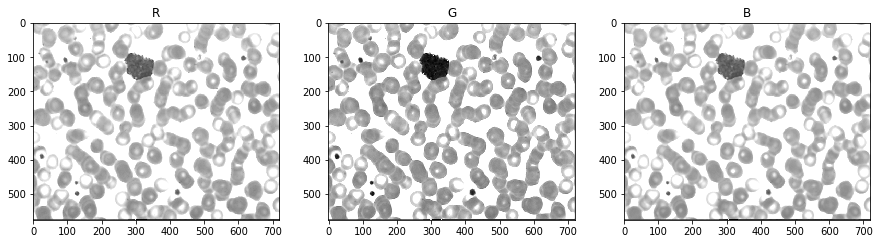

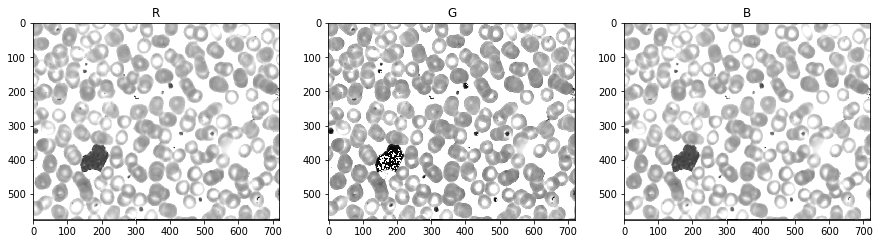

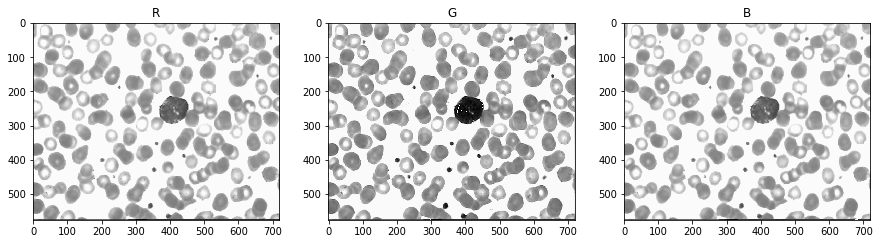

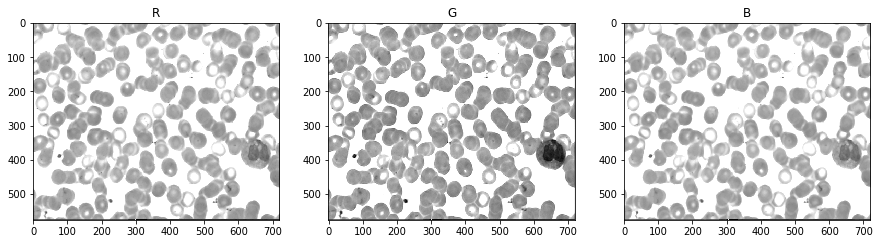

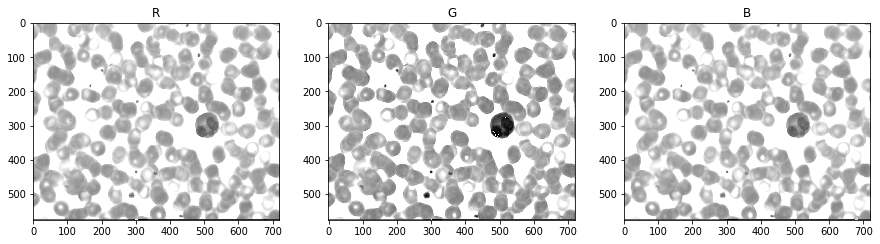

...

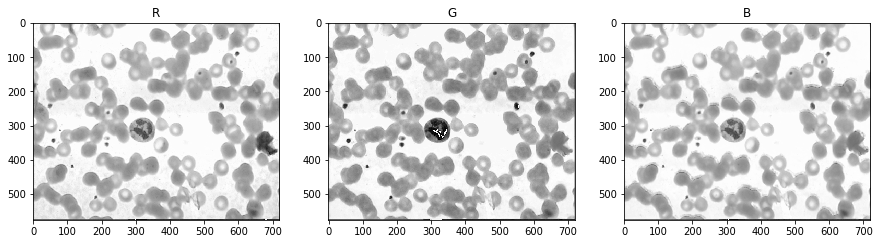

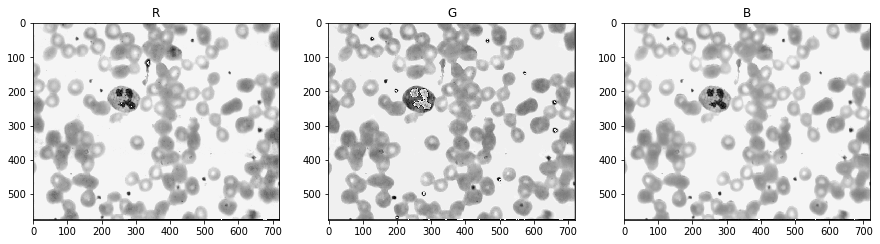

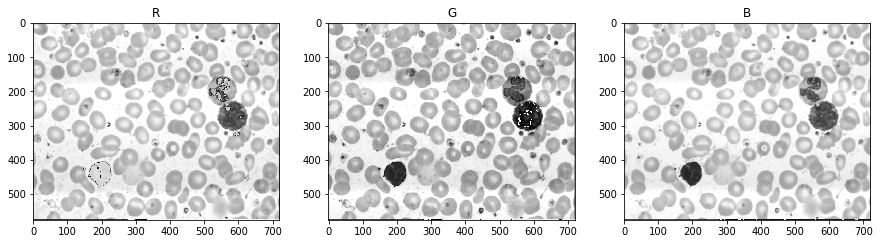

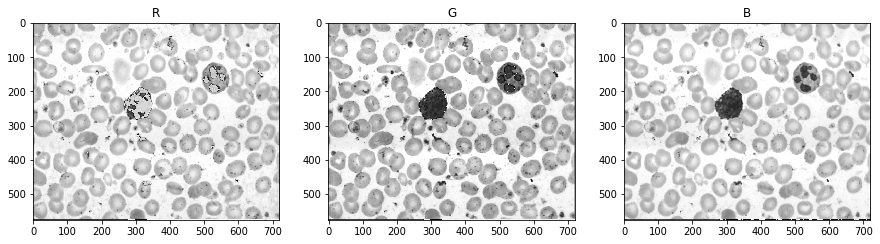

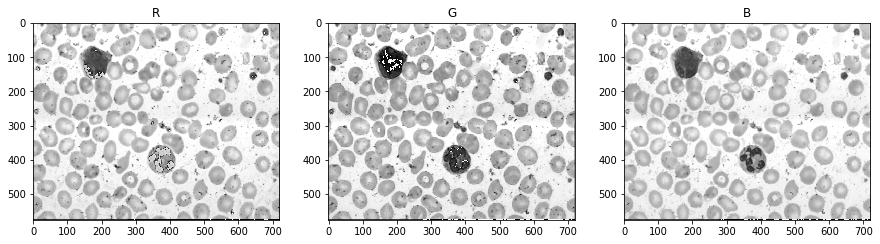

In [0]:
restas=[]
for matriz in enhanced:
  f, ax = plt.subplots(1, 3)
  f.set_figheight(15)
  f.set_figwidth(15)
  
  
  ax[0].imshow(matriz[:,:,0],cmap='gray')
  ax[0].set_title('R')
  
  
  ax[1].imshow(matriz[:,:,1],cmap='gray')
  ax[1].set_title('G')
  
  ax[2].imshow(matriz[:,:,2],cmap='gray')
  ax[2].set_title('B')
  

  

[93, 172, 249]


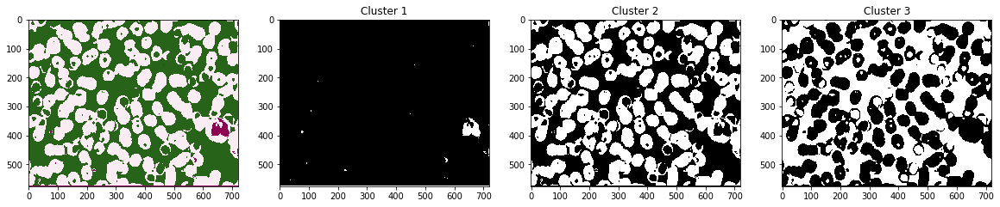

In [0]:
k=kmeans2([0,120,255],enhanced[3][:,:,2],1)

[144, 191, 248]


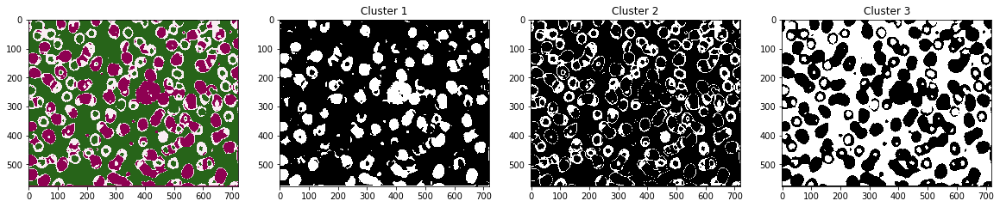

In [0]:
k=kmeans2([0,120,255],enhanced[2][:,:,2],1)

agarro una capa y donde tengo 1 en las mascara me quedo con el valor y fuera le pongo 1 y luego otsu

pruebo por entropia

In [0]:
def histograma(f):
  N=np.amax(f)+1
  hist=np.zeros(N)
  fil,col=f.shape
  for i in range(fil):
    for j in range(col):
      intensidad=f[i,j]
      hist[intensidad]+=1
  hist/=float(fil*col)
  
  return hist

In [0]:
def entropia(histograma):
  h=0
  for probabilidad in histograma:
    if probabilidad!=0:
      h-=probabilidad*np.log(probabilidad)
  return h

para decidir que capa de la imagen elegir calculamos el histograma de todas las capas y luego calculamos su entropia. De las 4 entropias nos quedeamos con la maxima dado que a mayor desorden tengo mas bins en el histograma y por lo tanto mayor contraste. Da siempre la verde por lo tanto el paso a seguir es realizar umbralizado solo en la zona de interes con las mascaras obtenidas.

[3.5998408554107946, 3.6360035885121356, 3.497530681652644, 3.025330894185115]
[37, 164, 249]
[3.8213330165011716, 3.884828751389434, 3.812793165985422, 3.1862243609725556]
[31, 167, 248]
[3.421852757079171, 3.495890643897563, 3.286194687683959, 2.8973466870732194]
[36, 153, 245]
[3.557962185256857, 3.614043965208782, 3.459427426848191, 3.0250976892718384]
[58, 159, 250]
[3.7759368416380275, 3.8155483384377136, 3.664890756616082, 3.1053727005350993]
[52, 164, 248]
[3.7241510816959846, 3.841000601850934, 3.6970415712275306, 3.3279663205219663]
[63, 166, 244]
[3.6711699553927484, 3.777275205051175, 3.6952354303763277, 3.2726605216970692]
[49, 163, 246]
[3.686280517697891, 3.762351379070172, 3.6658193219593747, 3.311013788797361]
[70, 161, 247]
[3.5318848826831957, 3.6382596981262534, 3.4428323938897796, 3.0570544626558647]
[44, 145, 245]
[3.7136644576907365, 3.7544375210273557, 3.6202286807829993, 3.056756465948505]
[47, 158, 247]
[3.225402968597677, 3.304552193709127, 3.046417231798004,

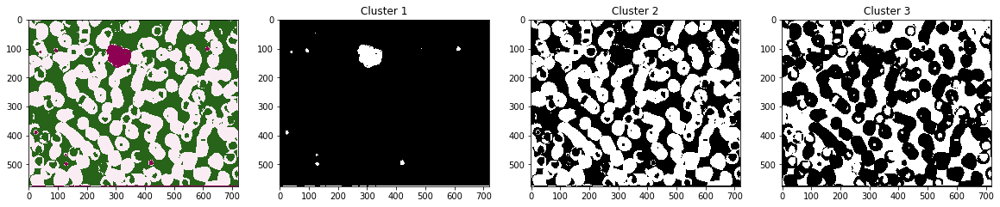

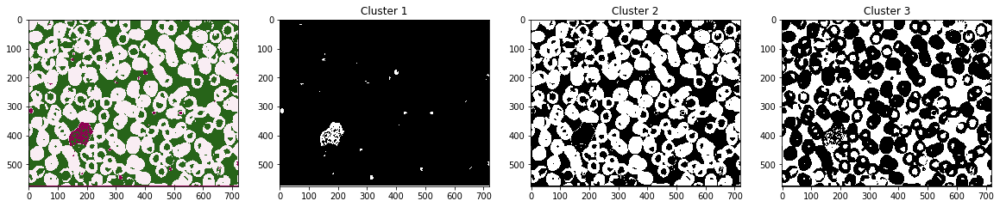

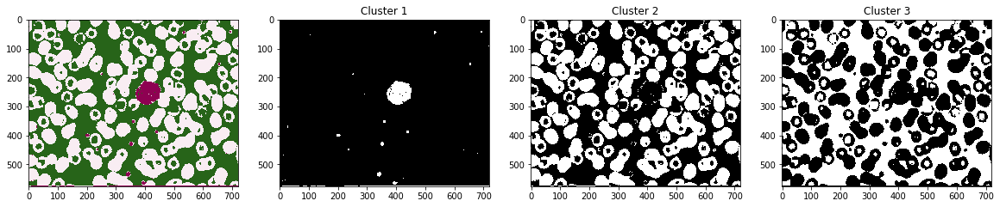

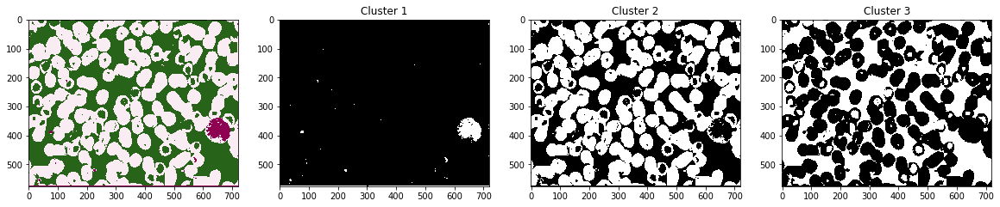

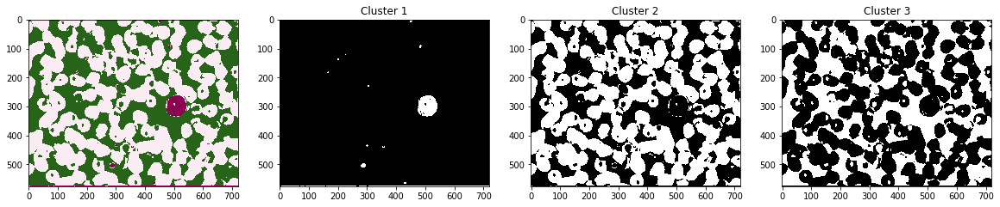

...

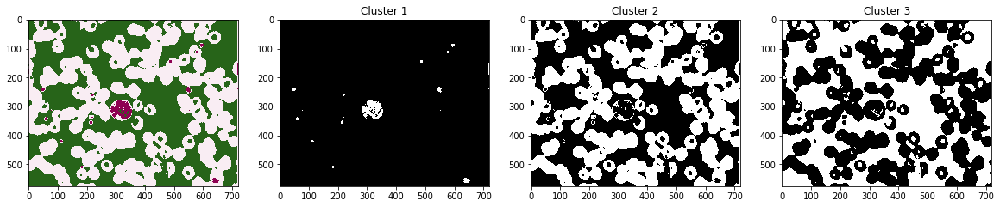

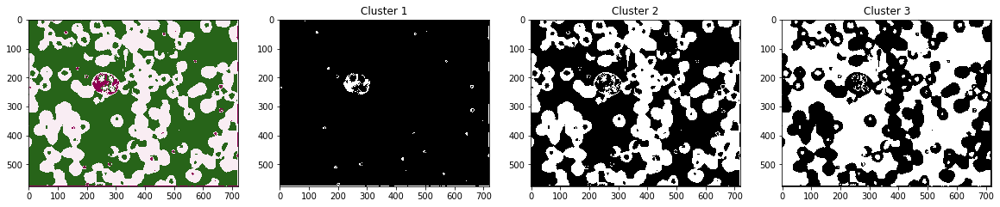

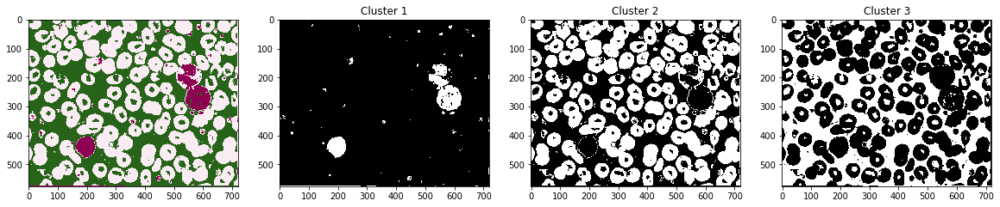

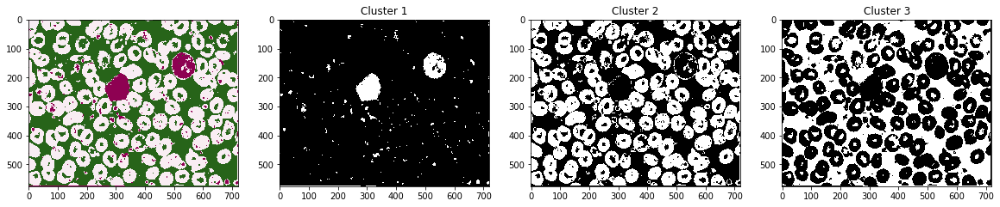

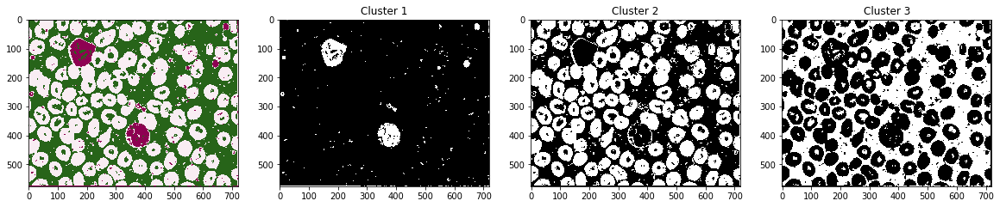

In [0]:
for element in enhanced:  
  entropias=[]
  matriz=element
  for i in range(3):
    hist=histograma(matriz[:,:,i])
    entropias.append(entropia(hist))

  resta=matriz[:,:,0]-matriz[:,:,1]
  hist=histograma(resta)
  entropias.append(entropia(hist))
  print(entropias)
  maximo=max(entropias)
  indice=entropias.index(maximo)
  if indice!=3:
    k=kmeans2([0,150,255],matriz[:,:,indice],1)
  else:
    k=kmeans2([0,150,255],resta,1)
  

## **Guardado de Imágenes de Enhanced**

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

directorioentrada='/content/drive/My Drive/PIB/Ajuste/' 
directoriosalida='/content/drive/My Drive/PIB/Enhanced/'
for i in gb:
  for n in range(1,i[1]+1):
    path_imagen=path.join(directorioentrada, i[0]+ '/'+str(n)+'.png')
    imagen=Image.open(path_imagen)
    matriz=np.asarray(imagen)
    
    ajuste=matriz
    opening=morphology.opening(ajuste)
    tophat=ajuste-opening

    closing=morphology.closing(ajuste)
    bothat=ajuste-closing

    I=ajuste+bothat-tophat

    path_salida=path.join(directoriosalida,i[0]+ '/Enhanced'+str(n)+'.png')
    scipy.misc.imsave(path_salida,I, format='png')
    

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


In [0]:
def zeroPadding(array, dim): #dim es la cantidad de filas (o columnas) de la mascara cuadrada (dim impar)
  
  fil = array[:,0].size
  col = array[0].size
  a = int((dim-1)/2)
  filSalida = fil+2*a
  colSalida = col+2*a
  
  salidaConPadding = np.zeros([filSalida,colSalida])
  salidaConPadding[a:filSalida-a,a:colSalida-a] = array
  
  return salidaConPadding

Nos quedamos con la parte de la imagen que se encuentra en la mascara

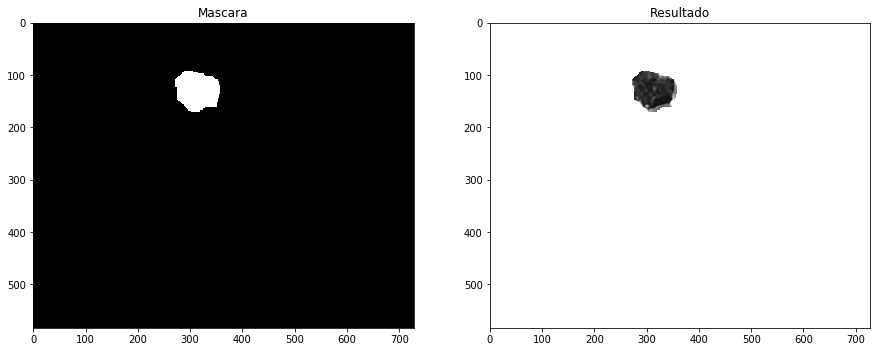

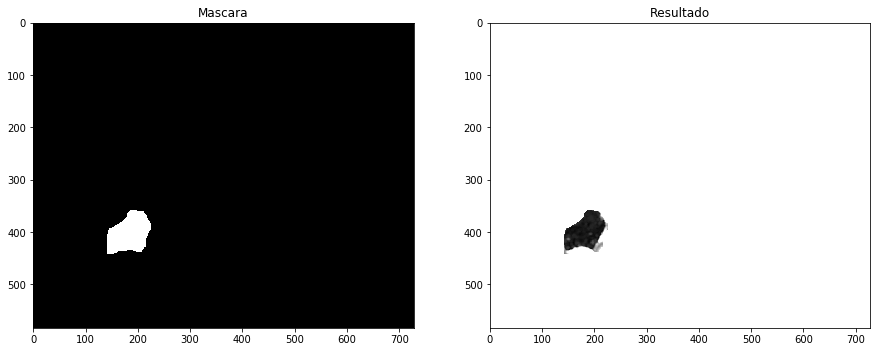

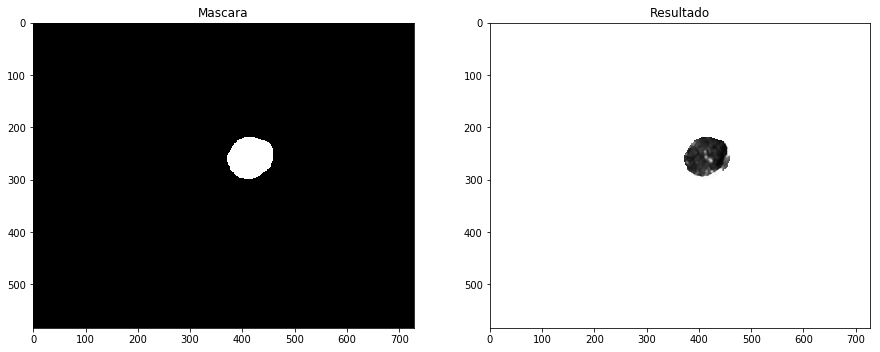

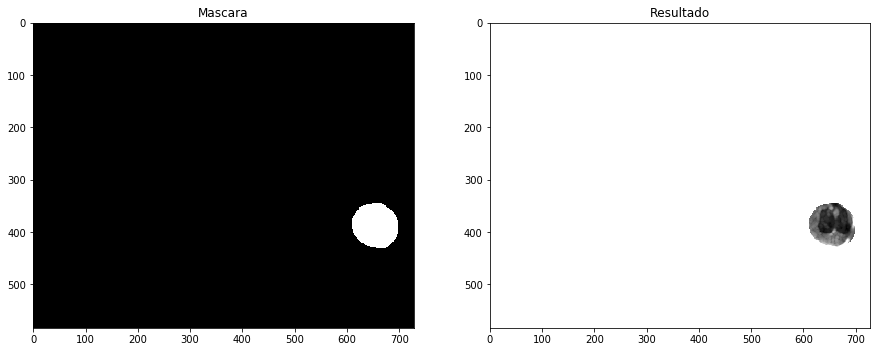

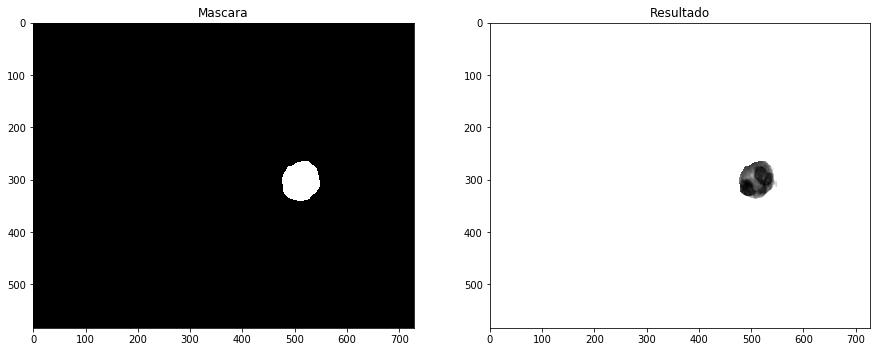

...

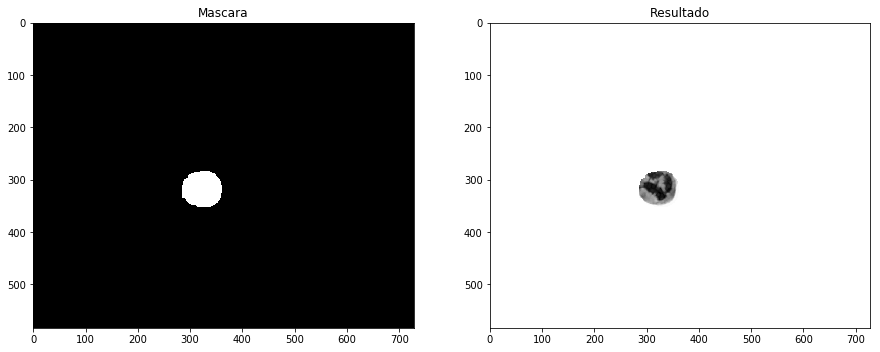

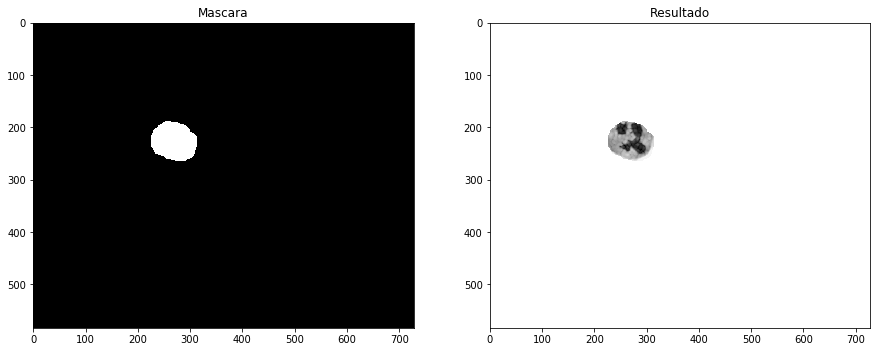

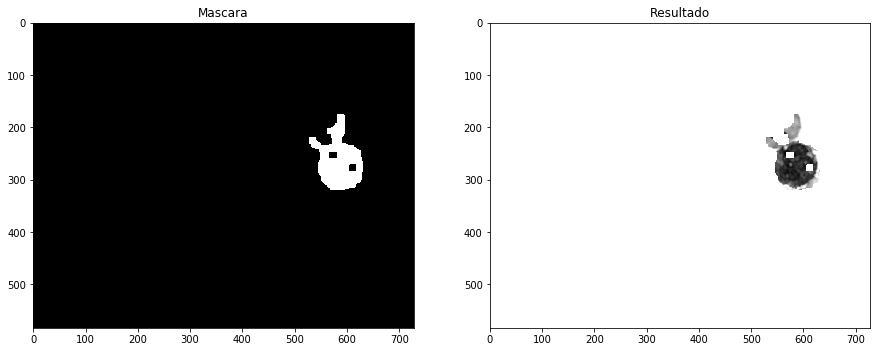

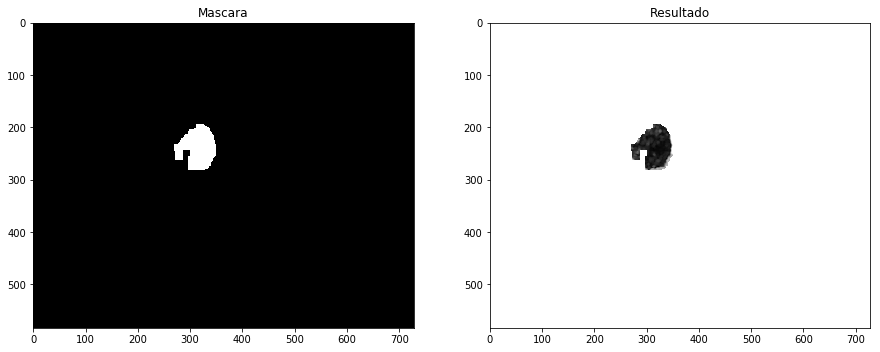

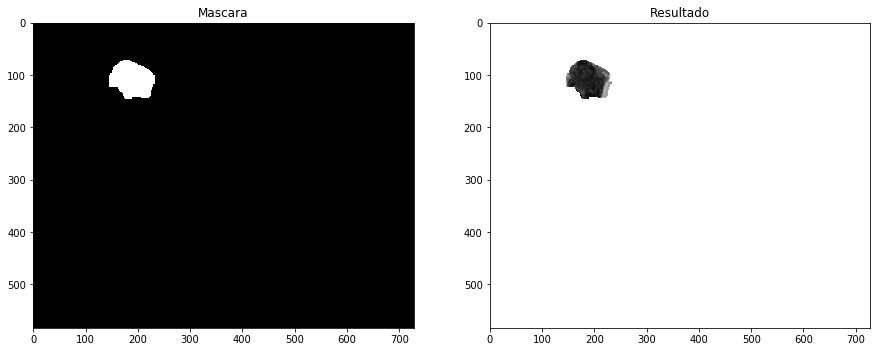

In [0]:
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_enhanced='/content/drive/My Drive/PIB/Enhanced/'
gb=[['Baso',3],['eosi',3],['lymp',2],['mono',3],['neut',3],['mixt',3]]

mascaras=[]
enhanced=[]

for i in gb:
  for n in range(1,i[1]+1):
    
    archivoenhanced=path.join(path_enhanced,i[0]+ '/Enhanced' +str(n)+'.png')
    e=Image.open(archivoenhanced)
    enhanced.append(np.asarray(e))
 
    archivomask=path.join(path_mascara,i[0]+ '/T' + str(n) +'.png')
    mascara=Image.open(archivomask)
    mascaras.append(zeroPadding(np.asarray(mascara),9))
    
    
    
fil,col=mascaras[0].shape
resultados=[]
  
for i in range(len(mascaras)):
  resultado=np.zeros((fil,col))
  for f in range(fil):
    for c in range(col):
      if (mascaras[i][f][c]==255):
        resultado[f][c]=enhanced[i][f][c][2]
      else:
        resultado[f][c]=255
  
  f, ax = plt.subplots(1, 2)
  f.set_figheight(15)
  f.set_figwidth(15)    
  ax[0].imshow(mascaras[i],cmap='gray')
  ax[0].set_title('Mascara')
  ax[1].imshow(resultado,cmap='gray')
  ax[1].set_title('Resultado')
  
  resultados.append(resultado)

  

In [0]:
def umbralizado(matriz,minimo,maximo):
  fil,col=matriz.shape
  umbral=np.zeros((fil,col))
  for f in range(fil):
    for c in range(col):
      if (matriz[f,c]>=minimo)&(matriz[f,c]<maximo):
        umbral[f,c]=1
        
  return umbral       

Se obtiene el nucleo de las celulas mediante un umbralizado.

SE GUARDA en arrays:

**nucleos** :lo que se obtiene del umbralizado de la imagen.

**nucleosCLOSE** :los nuclos luego de aplicarle closing.

In [0]:
def decisionDeUmbral(Resta):
  h = plt.hist((Resta.copy()).ravel(), bins = 256, density = True)
  g = h[1][128]
  
  if(g<-0.1):
    return 0
  else:
    return 1

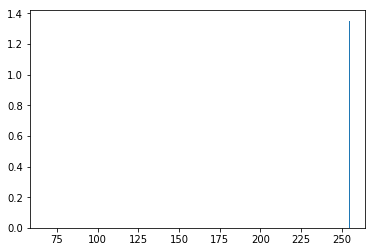

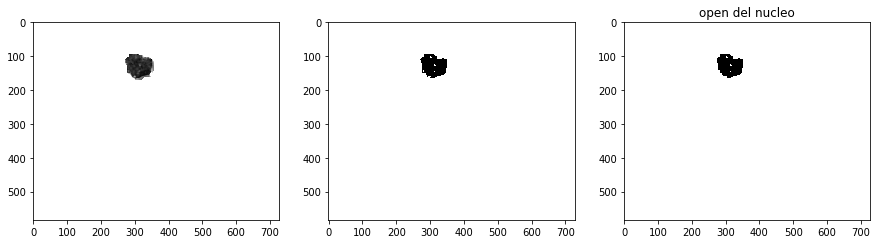

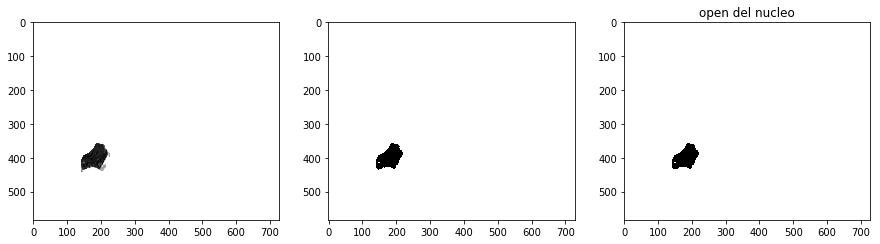

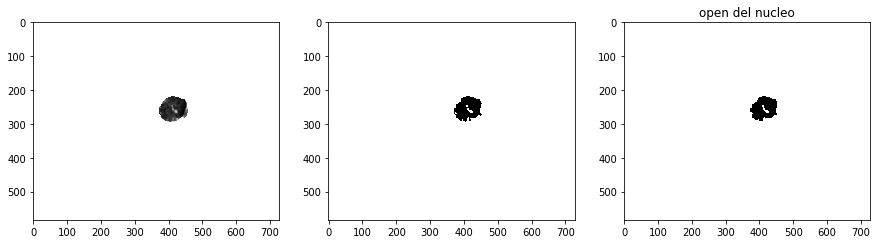

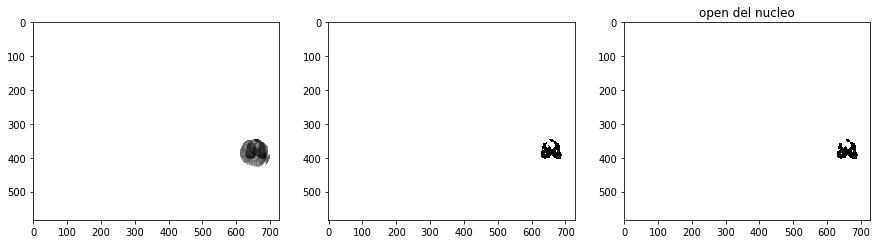

...

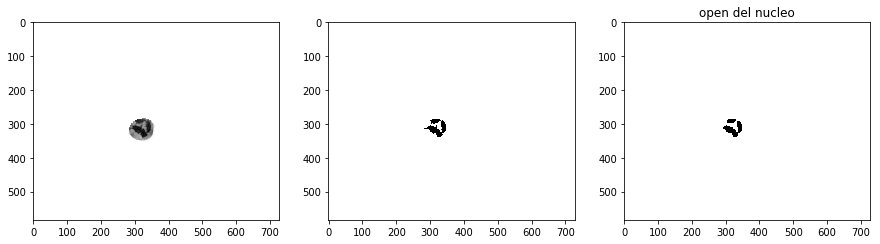

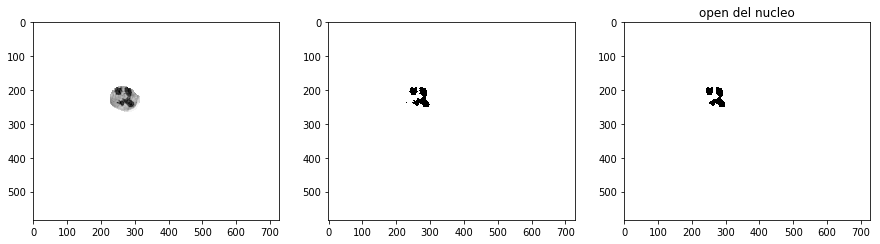

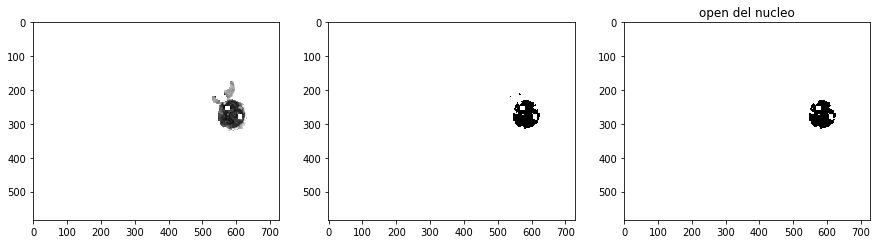

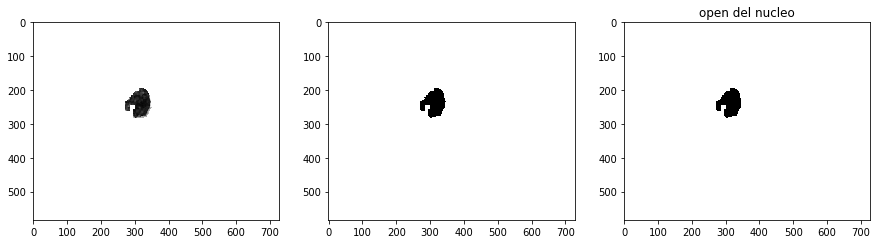

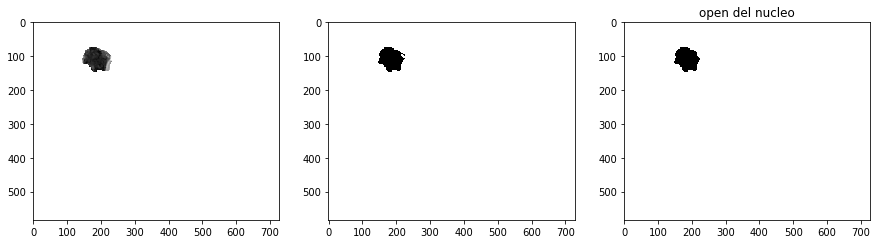

In [0]:

estructura=[[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1]]
for matriz in resultados:
  minimo=np.amin(matriz)
  numeros=np.unique(matriz)

  if(decisionDeUmbral(matriz)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
    minimo = np.amin(matriz)
    retval, threshold = cv2.threshold(matriz, 0, minimo, cv2.THRESH_BINARY)
  else:
    maximo = np.amax(matriz)
    retval, threshold = cv2.threshold(matriz, maximo*0.50, maximo, cv2.THRESH_BINARY)
  opening=morphology.binary_closing(threshold,estructura)
  nucleosCLOSE.append(opening)
  
  
  f, ax = plt.subplots(1, 3)
  f.set_figheight(15)
  f.set_figwidth(15)
  
  ax[0].imshow(matriz,cmap='gray')
  plt.title('imagen')
  
  ax[1].imshow(threshold,cmap='gray')
  plt.title('nucleo')
  ax[2].imshow(opening,cmap='gray')
  plt.title('open del nucleo')

## **Guardado de mascaras de núcleos**

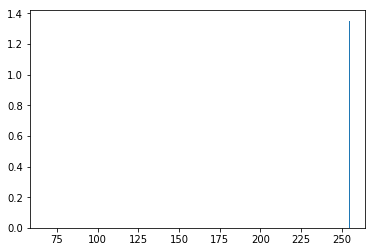

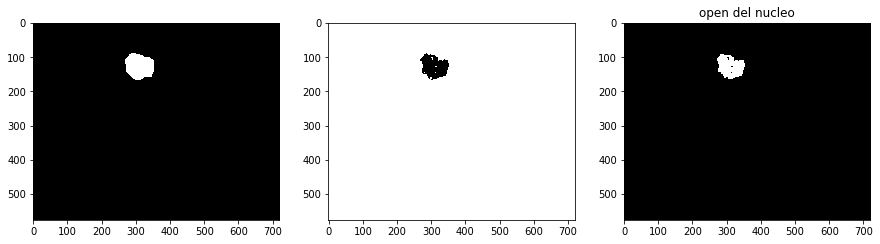

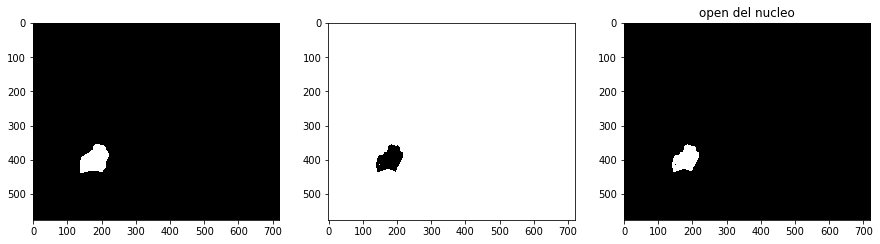

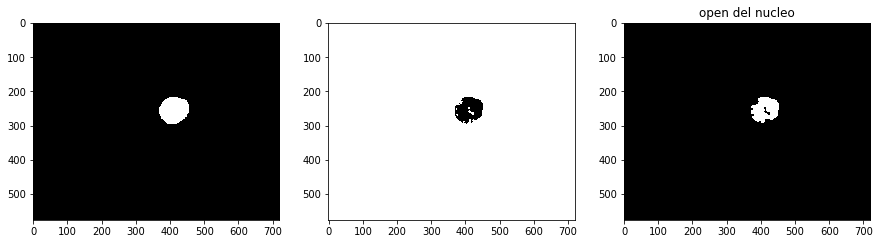

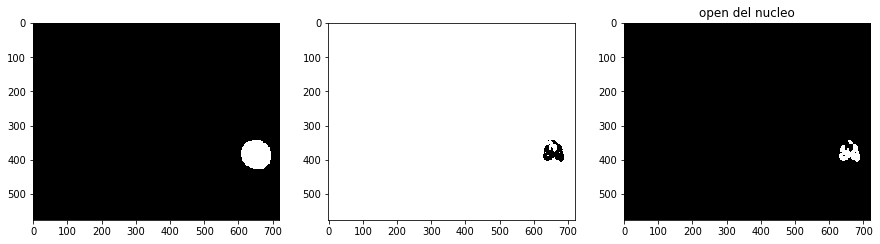

...

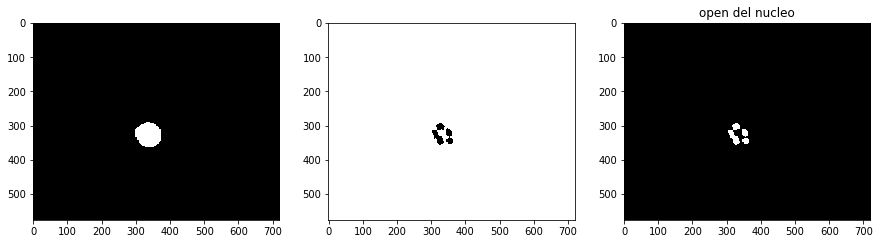

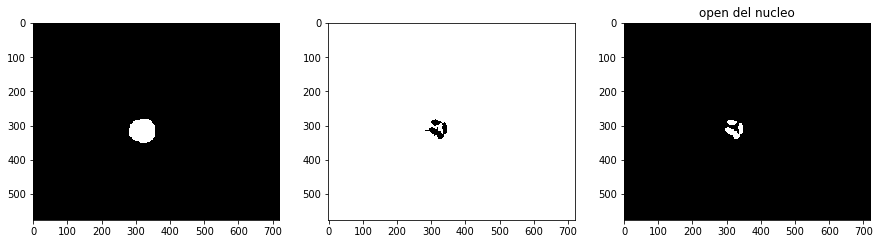

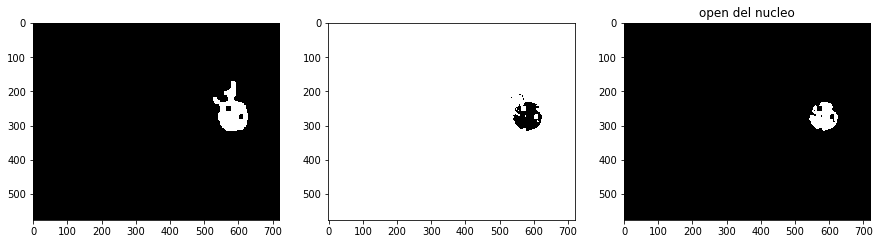

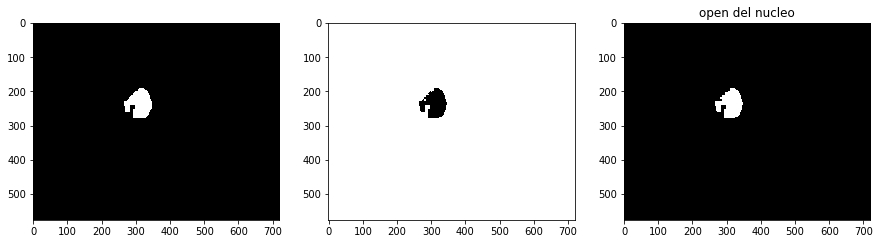

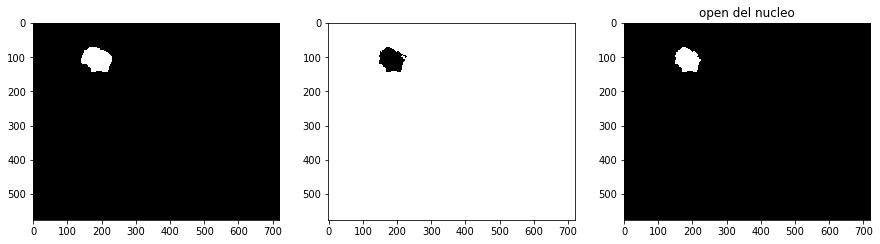

In [0]:
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_enhanced='/content/drive/My Drive/PIB/Enhanced/'
#gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]
gb=[['Baso',3],['eosi',3],['lymp',2],['mono',4],['neut',2],['mixt',3]]
estructura=[[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1]]

for i in gb:
  for n in range(1,i[1]+1):
    
    archivoenhanced=path.join(path_enhanced,i[0]+ '/Enhanced' +str(n)+'.png')
    enhanced=np.array(Image.open(archivoenhanced))
 
    archivomask=path.join(path_mascara,i[0]+ '/T' + str(n) +'.png')
    mascara=np.array(Image.open(archivomask))
    
    fil,col=mascara.shape
    resultado=np.zeros((fil,col))
    
    for f in range(fil):
      for c in range(col):
        if (mascara[f][c]==255):#me quedo solo con la parte que la mascara me dice que hay algo 
          resultado[f][c]=enhanced[f][c][2]#elegimos la capa B 
        else:
          resultado[f][c]=255

    if(decisionDeUmbral(resultado)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
      minimo = np.amin(resultado)
      maximo=np.amax(resultado)
      retval, threshold = cv2.threshold(resultado, 0, minimo, cv2.THRESH_BINARY)
    else:
      maximo = np.amax(resultado)
      retval, threshold = cv2.threshold(resultado, maximo*0.50, maximo, cv2.THRESH_BINARY)
    
    opening=morphology.binary_closing(threshold,estructura)

    #directorionucleos= path.join(path_mascara,i[0]+ '/N'+str(n)+'.png')
    #scipy.misc.imsave(directorionucleos,boolToBinary(opening), format='png')
    f, ax = plt.subplots(1, 3)
    f.set_figheight(15)
    f.set_figwidth(15)

    ax[0].imshow(mascara,cmap='gray')
    plt.title('imagen')

    ax[1].imshow(threshold,cmap='gray')
    plt.title('nucleo')
    ax[2].imshow(np.logical_not(opening),cmap='gray')
    plt.title('open del nucleo')

In [0]:
print(mascara.shape)
print(enhanced.shape)

(576, 720)
(576, 720, 3)


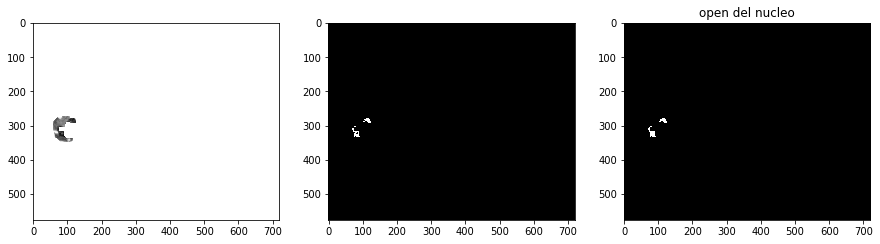

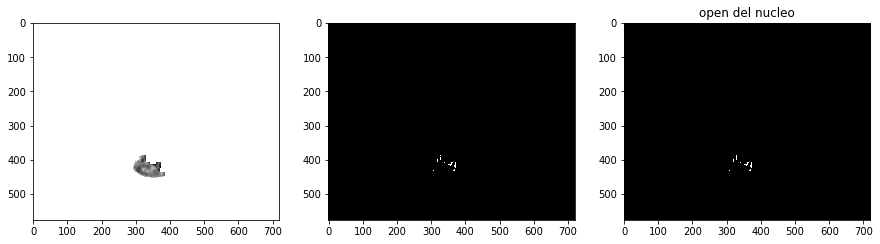

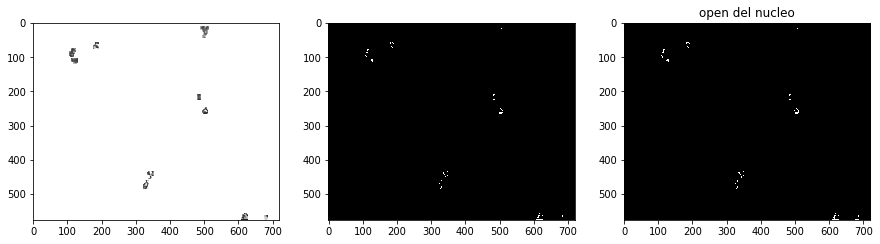

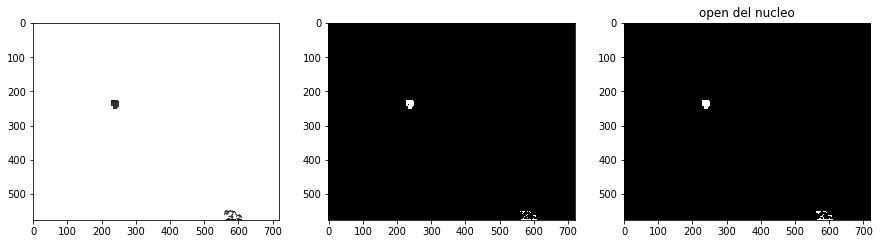

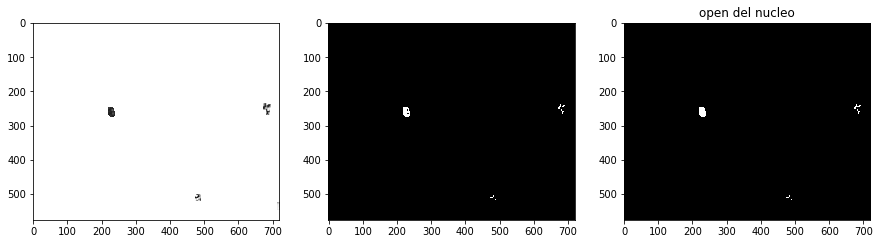

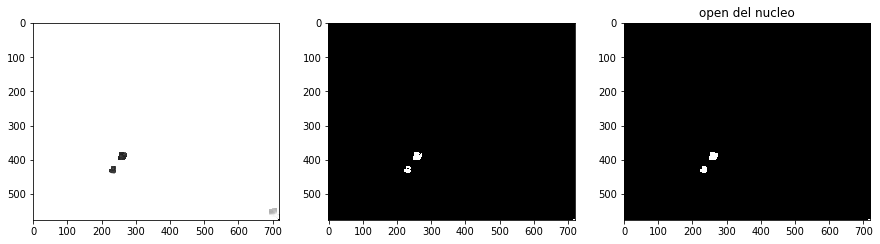

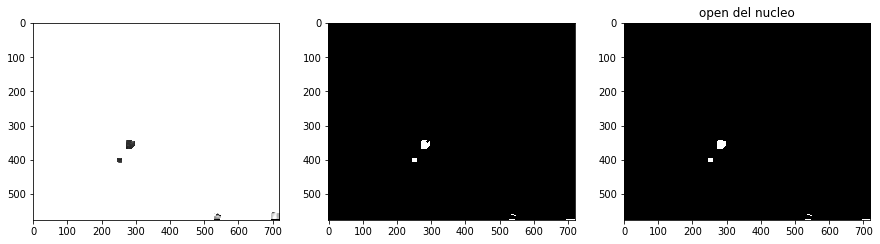

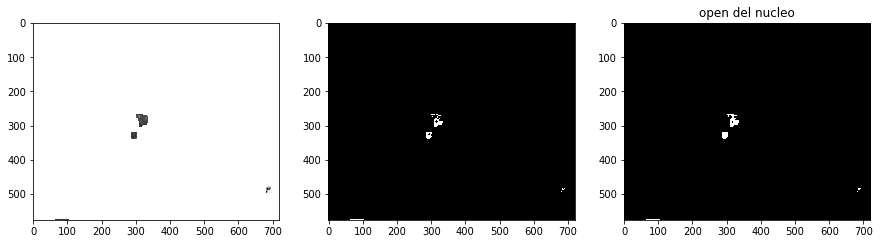

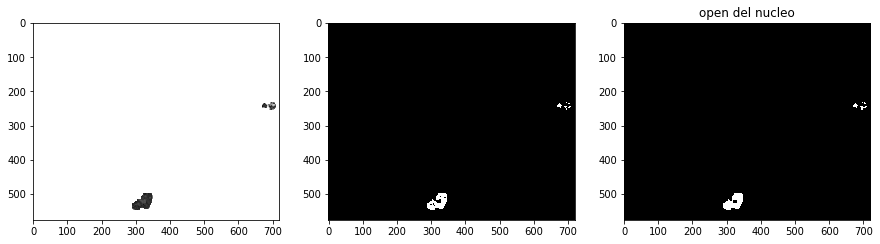

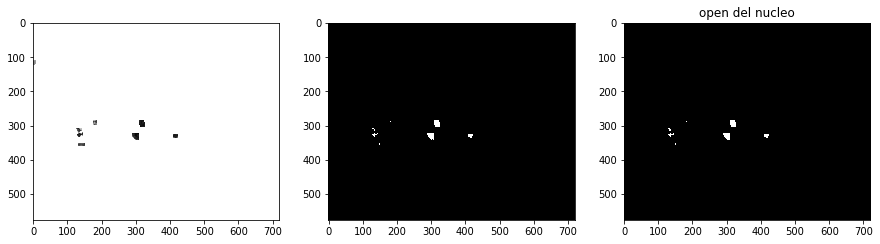

In [0]:
estructura=[[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1]]
path_mascara='/content/drive/My Drive/PIB/Mascaras/'


for matriz in resultados:
  minimo=np.amin(matriz)
  numeros=np.unique(matriz)
  L=len(numeros)
  maximos=numeros[L/4]
  umbral=umbralizado(matriz,minimo,maximos)
  
  opening=morphology.binary_closing(umbral,estructura)
    
  f, ax = plt.subplots(1, 3)
  f.set_figheight(15)
  f.set_figwidth(15)
  
  ax[0].imshow(matriz,cmap='gray')
  plt.title('imagen')
  
  ax[1].imshow(umbral,cmap='gray')
  plt.title('nucleo')
  ax[2].imshow(opening,cmap='gray')
  plt.title('open del nucleo')
  #directorionucleos= path.join(path_mascara,i[0]+ '/N'+str(n)+'.png')
  #scipy.misc.imsave(directorionucleos,opening, format='png')

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


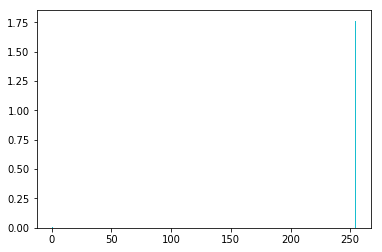

In [0]:
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_enhanced='/content/drive/My Drive/PIB/Enhanced/'
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]
estructura=[[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1],[1,1,1,1,1]]

for i in gb:
  for n in range(1,i[1]+1):
    
    archivoenhanced=path.join(path_enhanced,i[0]+ '/Enhanced' +str(n)+'.png')
    enhanced=np.array(Image.open(archivoenhanced))
 
    archivomask=path.join(path_mascara,i[0]+ '/T' + str(n) +'.png')
    mascara=np.array(Image.open(archivomask))
    
    fil,col=mascara.shape
    resultado=np.zeros((fil,col))
    
    for f in range(fil):
      for c in range(col):
        if (mascara[f][c]==255):#me quedo solo con la parte que la mascara me dice que hay algo 
          resultado[f][c]=enhanced[f][c][2]#elegimos la capa B 
        else:
          resultado[f][c]=255

    if(decisionDeUmbral(resultado)==0): # si el valor de intensidad en el que esta centrada el histograma es menor a cero, son fondo clarito celula oscura, sino al reves
      minimo = np.amin(resultado)
      maximo=np.amax(resultado)
      retval, threshold = cv2.threshold(resultado, 0, minimo, cv2.THRESH_BINARY)
    else:
      maximo = np.amax(resultado)
      retval, threshold = cv2.threshold(resultado, maximo*0.50, maximo, cv2.THRESH_BINARY)
    
    opening=np.logical_not(morphology.binary_closing(threshold,estructura))

    directorionucleos= path.join(path_mascara,i[0]+ '/N'+str(n)+'.png')
    scipy.misc.imsave(directorionucleos,boolToBinary(opening), format='png')


# **Guardado de Citoplasma**

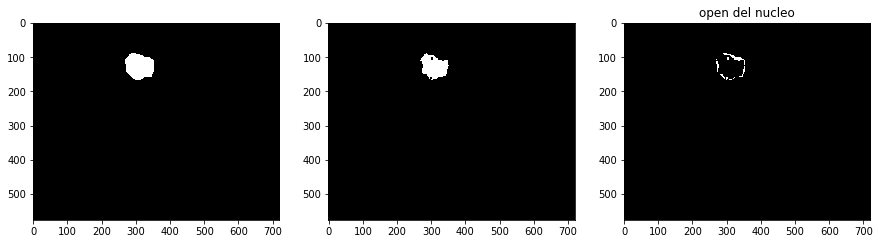

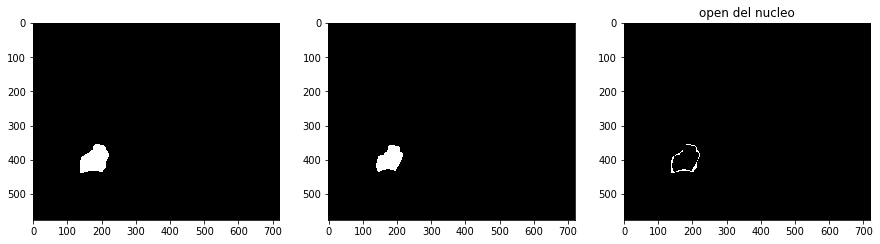

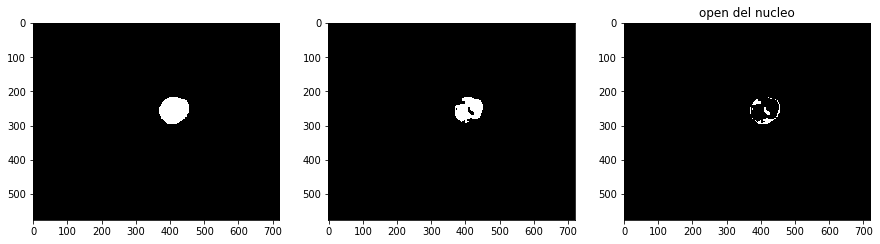

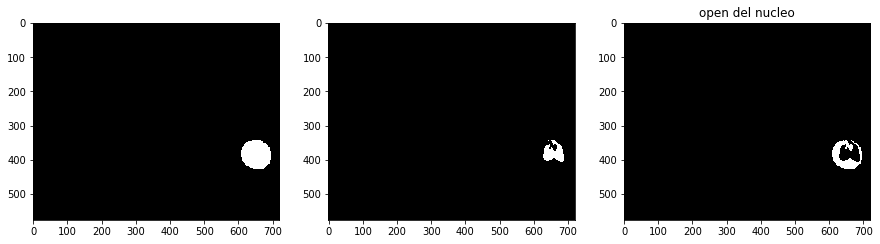

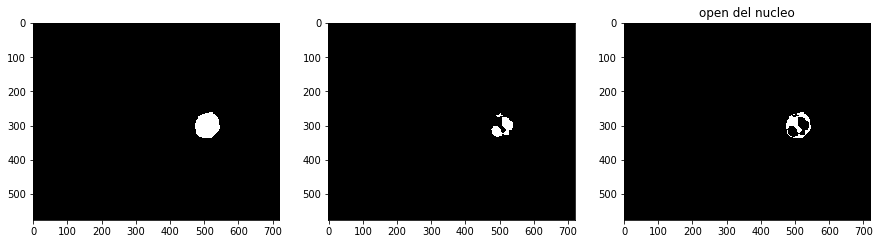

...

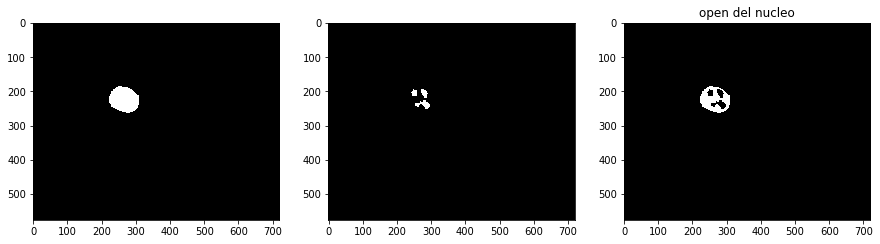

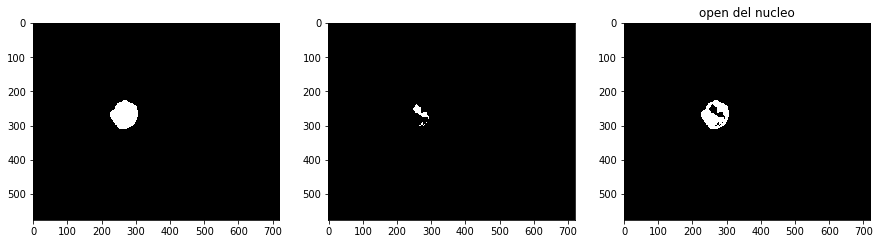

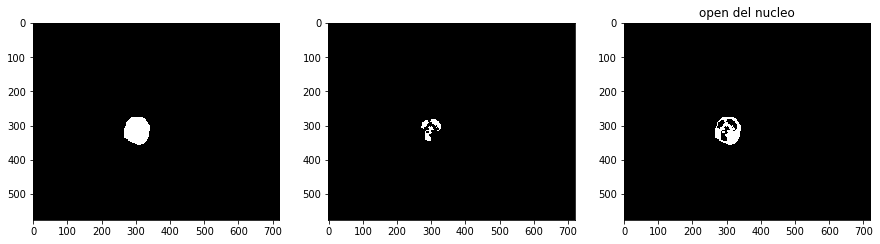

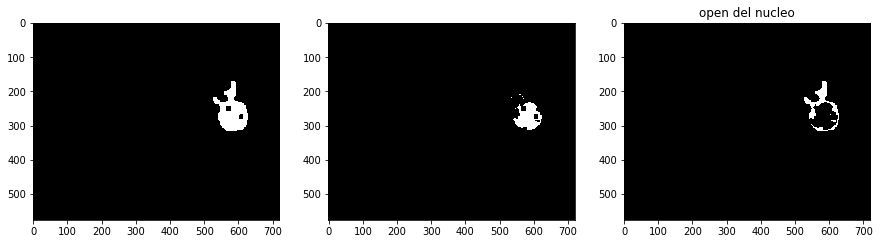

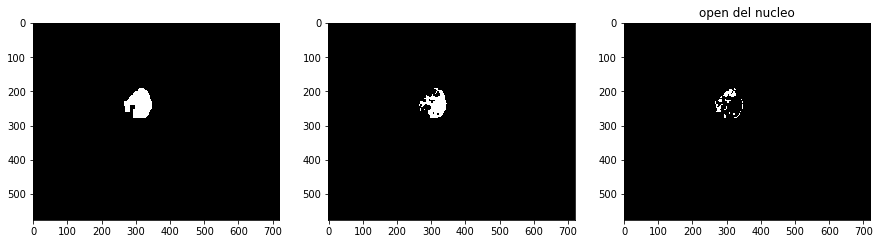

In [0]:
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
#gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]
gb=[['Baso',3],['eosi',3],['lymp',3],['mono',4],['neut',5],['mixt',2]]

for i in gb:
  for n in range(1,i[1]+1):
    
    archivonucleos=path.join(path_mascara,i[0]+ '/N' + str(n) +'.png')
    nucleo=np.asarray(Image.open(archivonucleos))
 
    archivomask=path.join(path_mascara,i[0]+ '/T' + str(n) +'.png')
    mascara=np.asarray(Image.open(archivomask))

    fil,col=nucleo.shape
    citoplasma=np.zeros((fil,col))
    for f in range(fil):
      for c in range(col):
        citoplasma[f,c]=mascara[f,c]-nucleo[f,c]
    f, ax = plt.subplots(1, 3)
    f.set_figheight(15)
    f.set_figwidth(15)

    ax[0].imshow(mascara,cmap='gray')
    plt.title('imagen')

    ax[1].imshow(nucleo,cmap='gray')
    plt.title('nucleo')
    
    ax[2].imshow(citoplasma,cmap='gray')
    plt.title('open del nucleo')
        

In [0]:
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
gb=[['Baso',53]]

for i in gb:
  for n in range(1,i[1]+1):
    
    archivonucleos=path.join(path_mascara,i[0]+ '/N' + str(n) +'.png')
    nucleo=np.asarray(Image.open(archivonucleos))
    
    archivomask=path.join(path_mascara,i[0]+ '/T' + str(n) +'.png')
    mascara=np.asarray(Image.open(archivomask))

    fil,col=nucleo.shape
    citoplasma=np.zeros((fil,col))
    for f in range(fil):
      for c in range(col):
        citoplasma[f,c]=mascara[f,c]-nucleo[f,c]
    
    directorionucleos= path.join(path_mascara, i[0]+ '/C'+str(n)+'.png')
    scipy.misc.imsave(directorionucleos,citoplasma, format='png')

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


# Clasificación de Células

**Baso:** celula homogenea con distintas formas

**Eosi:** celula circular con 2 o 3 nucleos

**Lymp:** celula con unico nucleo que ocupa casi todo el citoplasma.celulas circulares y chicas.Por imagen puede haber dos lymp


**neut:** Caritas. 3 o 4 nuclos. citoplasma ovalado.

**Mono:** nucleo unico, grande y de formas variadas. Celula grande y con formas muy variadas.

**Mix**: mezcla de celulas



In [0]:
#nucleosCLOSE
#mascaras
def BinarioAGris(matriz):
  fil,col=matriz.shape
  mat=np.zeros((fil,col))
  for i in range(fil):
    for j in range(col):
      if (matriz[i][j]==True):
        mat[i][j]=255
  return mat

def comparador(nucleo,mascara):
  mismatch=0 #numero de pixels que comparten el nucleo y la mascara
  fil,col=resta.shape
  nucleoGris=BinarioAGris(nucleo)
  r=mascara-nucleoGris
  N=0 # numero de pixeles que componen el area de la mascara
  for i in range(fil):
    for j in range(col):
      if mascara[i][j]==255:
        N+=1
        if r[i][j]==0:
          mismatch+=1
  return mismatch/np.float(N),r,N


FUNCIONES

**def BinarioAGris(matriz):**  Esta funcion convierte imagen en boolean a imagen en 1 y 0 para que todas las imagenes esten en el mismo formato

**def comparador(nucleo,mascara):**  Esta funcion toma la mascara y el nucleo. La funcion devuelve un indicador y la resta de la mascara y el nucleo. La funcion resta estas dos y compara la resta con la mascara. En el caso de que la mascara y el nucleo sean parecidas el indicador va a ser un numero cercano a 1. 

En el caso de que la celula tenga nucleos, el umbral va a segmentar la mascara entonces va a haber menos coincidencias entonces el indicador va a dar mayor

In [0]:
BasoLympMono=[]
EosiNeutMix=[]
lenmascaraBaso=[]
lenmascaraEosi=[]
index=[]

for p in range(len(mascaras)):
  
  mascara=mascaras[p]
  nucleo=nucleosCLOSE[p]
  indicador,resta,N=comparador(nucleo,mascara)
  index.append(indicador)
  

  if (indicador*100>50):
    BasoLympMono.append(nucleo)
    lenmascaraBaso.append(N)
  else:
    EosiNeutMix.append(nucleo)
    lenmascaraEosi.append(N)
  
  f, ax = plt.subplots(1, 3)
  f.set_figheight(15)
  f.set_figwidth(15)
 
  ax[0].imshow(mascara,cmap='gray')
  plt.title('Mascara')

  ax[1].imshow(nucleo,cmap='gray')
  plt.title('Nucleo')
  
  ax[2].imshow(resta,cmap='gray')
  plt.title('Resta')



  print(indicador)

#gb=[['Baso',3],['eosi',3],['lymp',2],['mono',3],['neut',3],['mixt',3]]

In [0]:
Lymp=[]
largoPromedio=np.mean(lenmascaraBaso)
print(largoPromedio)
print(lenmascaraBaso)
  
for i in range(len(BasoLympMono)):
  if lenmascaraBaso[i]<largoPromedio/2:
    Lymp.append(BasoLympMono[i])
    plt.figure()
    plt.imshow(BasoLympMono[i])
    plt.title('Lymp')


#gb=[['Baso',3],['eosi',3],['lymp',2],['mono',3],['neut',3],['mixt',3]]
#Bien: 3 baso, 2 lymp, 1 mono
#MIX MAL MASCARAS

Dividi en dos listas para agrupar celulas con caracteristicas similares:

 

*   Baso, lymp y mono
*   Eosi, neut y mixt

Como las mascaras totales de las mixt no estan completas, algunas celulas mix dan en el grupo de baso.

Del primer grupo se pueden dividir los baso y mono de los lymp por el tamaño. Los lymp son en general mas chicos que los otros dos. 

Luego el mono tiene la particularidad de tener mas visible el citoplasma.



In [0]:
def area(mask):#area=cant de pixeles que ocupa 
  fil,col=mask.shape
  area=0
  for f in range(fil):
    for c in range(col):
      if (mask[f,c]==1):
        area+=1
  return area     

def getBorder(mask):
  #mask debe ser binaria
  dilatacion=morphology.binary_dilation(mask)#no le pongo elemento estructurante por que es una cruz y quiero eso
  fil,col=mask.shape 
  borde=np.zeros((fil,col))
  for f in range(fil):
    for c in range(col):
      if (dilatacion[f,c]==1) & (mask[f,c]==0): 
        borde[f,c]=1
  return borde
  
def perimeter(mask):
  borde=getBorder(mask)
  fil,col=mask.shape 
  perimetro=0
  for f in range(fil):
    for c in range(col):
      if (borde[f,c]==1):
        perimetro+=1
  return perimetro

def circularity(mask):
  perimetro=perimeter(mask)
  a=area(mask)
  c=perimetro**2/float(4*np.pi*a)
  return c

def ratioNC(maskN,maskT): #area del nucleo/area del wbc
  fil,col=maskN.shape
  areaN=area(maskN)
  areaT=area(maskT)
  ratio=areaN/float(areaT)
  return ratio      

def histograma(f):
  N=np.amax(f)
  hist=np.zeros(N)
  fil,col=f.shape
  for i in range(fil):
    for j in range(col):
      intensidad=f[i,j]
      hist[intensidad]+=1
  hist/=float(fil*col)
  
  return hist

def entropia(histograma):
  h=0
  for probabilidad in histograma:
    if (probabilidad!=0):
      h-=probabilidad*np.log(probabilidad)
  return h

def sumSquareVariance(imagen):
  fil,col=imagen.shape
  ssv=0
  var=np.var(imagen)
  for f in range(fil):
    for c in range(col):
      ssv+=(f-var**2)*imagen[f,c]
      
  return ssv

def inverseDifferenceMoment(imagen):
  fil,col=imagen.shape
  idm=0
  for f in range(fil):
    for c in range(col):
      idm+=imagen[f,c]/float(1+(f-c)**2)
  
  return idm

def angularSecondMoment(imagen):
  fil,col=imagen.shape
  asm=0
  for f in range(fil):
    for c in range(col):
      asm+=imagen[f,c]**2
  return asm
  
import skimage.feature as ft

def getRadius(imagen):#usar la que hicimos trucha con la mascara y celula
  fil,col=imagen.shape
  for f in range(fil):
    for c in range(col):
      if imagen[f][c]==1:
          filas.append(f)
          columnas.append(c)
      if (len(filas)!=0)&(len(columnas)!=0): 
        fmax=max(filas)
        fmin=min(filas)
        cmax=max(columnas)
        cmin=min(columnas)     
        R=max(fmax-fmin,cmax-cmin)   
  return R

def LBP(imagen):#usar la que hicimos trucha con la mascara y celula
  R=getRadius(imagen)
  P=16
  lbp=feature.local_binary_pattern(imagen,P,R)
  return lbp

def binarizar(array):
  fil = array.shape[0]
  col = array.shape[1]
  salida = np.zeros([fil,col])
  
#   u = np.unique(array)
  
  for i in range(fil):
    for j in range(col):
      if(array[i,j]==255):
        salida[i,j] = 1
  
  return salida

def etiquetado(arrayBinario):
  proximaEtiqueta = 2
  filas = arrayBinario[:,0].size
  columnas = arrayBinario[0].size
  arrayEntero = 1*arrayBinario
  contador = 0
  salida = np.zeros([filas,columnas])
  salidas = []
  
  for i in range(filas):
    for j in range(columnas):
      if(arrayEntero[i,j] == 1):
        etiquetarRegionConexa(arrayEntero, i, j, proximaEtiqueta)
        proximaEtiqueta +=1
        contador += 1
        
  for k in range(2,proximaEtiqueta):
    salida = np.zeros([filas,columnas])
    for i in range(filas):
      for j in range(columnas):
        if(arrayEntero[i,j] == k):
          salida[i,j] = 1
          
    salidas.append(salida)

  return contador,salidas

#FUNCION 2
def etiquetarRegionConexa(arrayEntero, i, j, etiqueta):
  stack = []
  stack.append((i,j))
  filas = arrayEntero[:,0].size
  columnas = arrayEntero[0].size
  while(stack):
    x,y = stack.pop()

    if(x< 0 or y<0 or x>filas-1 or y>columnas-1):
      continue
    if(arrayEntero[x,y] != 1):
      continue
    
    arrayEntero[x,y] = etiqueta
    stack.append((x+1,y))
    stack.append((x-1,y))
    stack.append((x,y+1))
    stack.append((x,y-1))
    


In [0]:
gb = [['Baso',28],['eosi',28],['lymp',24],['mono',26],['neut',25],['mixt',4]]

path_mascara = '/content/drive/My Drive/PIB/Mascaras/'
metrics = []
metricas = []

for i in gb:
  metrics = []
  for n in range(1,i[1]+1):
    
    path_final = path.join(path_mascara, i[0]+'/T' + str(n)+'.png')
    mask = np.array(Image.open(path_final))
    
    a = area(binarizar(mask))
    metrics.append(a)
    
  metricas.append(metrics)


In [0]:
def separarCelulas(maskT):
  contador,salidas = etiquetado(maskT)
  
  return contador,salidas


def clasificarShape(maskT, maskN, maskC): #sirve para una celula
  
  a = area(maskT)
  p = perimeter(maskT)
  c = circularity(maskT)
  rnc = ratioNC(maskN, maskT)
  
  return a,p,c,rnc

In [0]:
gb = [['Baso',28],['eosi',28],['lymp',26],['mono',24],['neut',25],['mixt',4]]

areas=[]
perimetro=[]
circularidad=[]
rationc=[]


for i in gb:
  listaa=[]
  listap=[]
  listac=[]
  listarnc=[]
  for n in range(1,i[1]+1):
  
    pathT = '/content/drive/My Drive/PIB/Mascaras/'+ i[0] + '/T' + str(n)+ '.png'
    mascaraT = np.array(Image.open(pathT))

    pathN='/content/drive/My Drive/PIB/Mascaras/'+ i[0] + '/N' + str(n)+ '.png'
    mascaraN = np.array(Image.open(pathN))

    pathC='/content/drive/My Drive/PIB/Mascaras/'+ i[0] + '/C' + str(n)+ '.png'
    mascaraC = np.array(Image.open(pathC))
    cont,salidas = separarCelulas(binarizar(mascaraT))

    for m in range(cont):
      mask = salidas[m]
      maskN = recortarImagen(binarizar(mascaraN),mask)
      maskC = recortarImagen(binarizar(mascaraC),mask)

      a,p,c,rnc = clasificarShape(mask,maskN, maskC)
      listaa.append(a)
      listap.append(p)
      listac.append(c)
      listarnc.append(rnc)
    
    
  areas.append(listaa)
  perimetro.append(listap)
  circularidad.append(listac)
  rationc.append(listarnc)
      

In [0]:
gbnot = [17,16,15,14,13,15,14,13,12,11,10]
lista1=areas
lista2=perimetro
lista3=circularidad
lista4=rationc
areamod=[]
perimetromod=[]
circularidadmod=[]
rationcmod=[]

listaa1=lista1[1][0:9]
listaa2=lista1[1][17:len(lista1[1])]
areamod=listat1+listat2

listap1=lista2[1][0:9]
listap2=lista2[1][17:len(lista2[1])]
perimetromod=listap1+listap2

listac1=lista3[1][0:9]
listac2=lista3[1][17:len(lista3[1])]
circularidadmod=listac1+listac2

listarnc1=lista4[1][0:9]
listarnc2=lista4[1][17:len(lista4[1])]
rationcmod=listarnc1+listarnc2

print('Mean Area de Baso='+str(np.mean(areas[0])))
print('Mean Area de eosi='+str(np.mean(areamod)))
print('Mean Area de lymp='+str(np.mean(areas[2])))
print('Mean Area de mono='+str(np.mean(areas[3])))
print('Mean Area de neut='+str(np.mean(areas[4])))
print('Mean Area de mixt='+str(np.mean(areas[5])))

print('std Area de Baso='+str(np.std(areas[0])))
print('std Area de eosi='+str(np.std(areamod)))
print('std Area de lymp='+str(np.std(areas[2])))
print('std Area de mono='+str(np.std(areas[3])))
print('std Area de neut='+str(np.std(areas[4])))
print('std Area de mixt='+str(np.std(areas[5])))

print('max Area de Baso='+str(max(areas[0])))
print('max Area de eosi='+str(max(areamod)))
print('max Area de lymp='+str(max(areas[2])))
print('max Area de mono='+str(max(areas[3])))
print('max Area de neut='+str(max(areas[4])))
print('max Area de mixt='+str(max(areas[5])))

print('min Area de Baso='+str(min(areas[0])))
print('min Area de eosi='+str(min(areamod)))
print('min Area de lymp='+str(min(areas[2])))
print('min Area de mono='+str(min(areas[3])))
print('min Area de neut='+str(min(areas[4])))
print('min Area de mixt='+str(min(areas[5])))

print('Mean perimetro de Baso='+str(np.mean(perimetro[0])))
print('Mean perimetro de eosi='+str(np.mean(perimetromod)))
print('Mean perimetro de lymp='+str(np.mean(perimetro[2])))
print('Mean perimetro de mono='+str(np.mean(perimetro[3])))
print('Mean perimetro de neut='+str(np.mean(perimetro[4])))
print('Mean perimetro de mixt='+str(np.mean(perimetro[5])))

print('std perimetro de Baso='+str(np.std(perimetro[0])))
print('std perimetro de eosi='+str(np.std(perimetromod)))
print('std perimetro de lymp='+str(np.std(perimetro[2])))
print('std perimetro de mono='+str(np.std(perimetro[3])))
print('std perimetro de neut='+str(np.std(perimetro[4])))
print('std perimetro de mixt='+str(np.std(perimetro[5])))

print('max perimetro de Baso='+str(max(perimetro[0])))
print('max perimetro de eosi='+str(max(perimetromod)))
print('max perimetro de lymp='+str(max(perimetro[2])))
print('max perimetro de mono='+str(max(perimetro[3])))
print('max perimetro de neut='+str(max(perimetro[4])))
print('max perimetro de mixt='+str(max(perimetro[5])))

print('min perimetro de Baso='+str(min(perimetro[0])))
print('min perimetro de eosi='+str(min(perimetromod)))
print('min perimetro de lymp='+str(min(perimetro[2])))
print('min perimetro de mono='+str(min(perimetro[3])))
print('min perimetro de neut='+str(min(perimetro[4])))
print('min perimetro de mixt='+str(min(perimetro[5])))

print('Mean circularidad de Baso='+str(np.mean(circularidad[0])))
print('Mean circularidad de eosi='+str(np.mean(circularidadmod)))
print('Mean circularidad de lymp='+str(np.mean(circularidad[2])))
print('Mean circularidad de mono='+str(np.mean(circularidad[3])))
print('Mean circularidad de neut='+str(np.mean(circularidad[4])))
print('Mean circularidad de mixt='+str(np.mean(circularidad[5])))

print('std circularidad de Baso='+str(np.std(circularidad[0])))
print('std circularidad de eosi='+str(np.std(circularidadmod)))
print('std circularidad de lymp='+str(np.std(circularidad[2])))
print('std circularidad de mono='+str(np.std(circularidad[3])))
print('std circularidad de neut='+str(np.std(circularidad[4])))
print('std circularidad de mixt='+str(np.std(circularidad[5])))

print('max circularidad de Baso='+str(max(circularidad[0])))
print('max circularidad de eosi='+str(max(circularidadmod)))
print('max circularidad de lymp='+str(max(circularidad[2])))
print('max circularidad de mono='+str(max(circularidad[3])))
print('max circularidad de neut='+str(max(circularidad[4])))
print('max circularidad de mixt='+str(max(circularidad[5])))

print('min circularidad de Baso='+str(min(circularidad[0])))
print('min circularidad de eosi='+str(min(circularidadmod)))
print('min circularidad de lymp='+str(min(circularidad[2])))
print('min circularidad de mono='+str(min(circularidad[3])))
print('min circularidad de neut='+str(min(circularidad[4])))
print('min circularidad de mixt='+str(min(circularidad[5])))

print('Mean rationc de Baso='+str(np.mean(rationc[0])))
print('Mean rationc de eosi='+str(np.mean(rationcmod)))
print('Mean rationc de lymp='+str(np.mean(rationc[2])))
print('Mean rationc de mono='+str(np.mean(rationc[3])))
print('Mean rationc de neut='+str(np.mean(rationc[4])))
print('Mean rationc de mixt='+str(np.mean(rationc[5])))

print('std rationc de Baso='+str(np.std(rationc[0])))
print('std rationc de eosi='+str(np.std(rationcmod)))
print('std rationc de lymp='+str(np.std(rationc[2])))
print('std rationc de mono='+str(np.std(rationc[3])))
print('std rationc de neut='+str(np.std(rationc[4])))
print('std rationc de mixt='+str(np.std(rationc[5])))

print('max rationc de Baso='+str(max(rationc[0])))
print('max rationc de eosi='+str(max(rationcmod)))
print('max rationc de lymp='+str(max(rationc[2])))
print('max rationc de mono='+str(max(rationc[3])))
print('max rationc de neut='+str(max(rationc[4])))
print('max rationc de mixt='+str(max(rationc[5])))

print('min rationc de Baso='+str(min(rationc[0])))
print('min rationc de eosi='+str(min(rationcmod)))
print('min rationc de lymp='+str(min(rationc[2])))
print('min rationc de mono='+str(min(rationc[3])))
print('min rationc de neut='+str(min(rationc[4])))
print('min rationc de mixt='+str(min(rationc[5])))



In [0]:
gb = [['Baso',28],['eosi',28],['lymp',26],['mono',24],['neut',25],['mixt',4]]

areas=[]
perimetro=[]
circularidad=[]
rationc=[]
pathtemplate = '/content/drive/My Drive/PIB/Dataset/Main Dataset/Baso/1.bmp'
template = np.array(Image.open(pathtemplate))


for i in gb:
  listavar=[]
  listamedia=[]
  for n in range(1,i[1]+1):
  
    pathcel = '/content/drive/My Drive/PIB/Dataset/Main Dataset/'+ i[0] + '/' + str(n)+ '.bmp'
    celula = np.array(Image.open(pathcel))
    
    pathT = '/content/drive/My Drive/PIB/Mascaras/'+ i[0] + '/T' + str(n)+ '.png'
    mascaraT = np.array(Image.open(pathT))
    
    recorte,recortecolor=np.array(recortarImagen(celula,mascaraT))
    
    #cont,salidas = separarCelulas(recortecolor)
    #print(cont)
    
    #for m in range(cont):
     # cel = salidas[m]
      
    listavar.append(colorvar(recortecolor,template))
    
    listamedia.append(colormedia(recortecolor,template))
    


In [0]:
def isBaso(a, r):
  pesos = [0,0,0,0,0]

  if(a>2500):
    pesos[0] = pesos[0] +1
  if(a>1000 and a<3000):
    pesos[1] = pesos[1] + 1
  if(a>0 and a<2300): #mas importancia si es muy chica
    pesos[2] = pesos[2] + 2

  if(a>3410and a<7450):
    pesos[3] = pesos[3] + 1
  if(a>3850 and a<5368):
    pesos[4] = pesos[4] + 1


  if(r>0.75 and r<=1): #mas importancia si es mayor al 75%!!
    pesos[0] = pesos[0] +2
  if(r>0.3 and r<0.7):
    pesos[1] = pesos[1] + 1
  if(r>0.6 and r<0.85):
    pesos[2] = pesos[2] + 1

  if(r>0.48and r<0.7):
    pesos[3] = pesos[3] + 1

  if(r>0.31 and r<0.48):
    pesos[4] = pesos[4] + 1

  print(pesos)
  
  if(pesos[0] == max(pesos) and pesos.count(max(pesos)) == 1):
    return 1
  else:
    return 0

  
gb = [['Baso',29,53],['eosi',29,39],['lymp',26,52],['mono',24,48],['neut',25,50]]

basos = []
for i in gb:
  
  for n in range(i[1],i[2]+1):
    baso = []
    pathmask = '/content/drive/My Drive/PIB/Mascaras/'
    o = i[0]+'/T'+str(n)+'.png'
    masktotal = np.asarray(Image.open(pathmask+o))
    pathnuc = '/content/drive/My Drive/PIB/Mascaras/'
    o = i[0]+'/N'+str(n)+'.png'
    masknuc = np.asarray(Image.open(pathnuc+o))
    pathcit = '/content/drive/My Drive/PIB/Mascaras/'
    o = i[0]+'/C'+str(n)+'.png'
    maskcit = np.asarray(Image.open(pathcit+o))
    cont,salidas = separarCelulas(binarizar(masktotal))

    for m in range(cont):
      mask = salidas[m]
      maskN = recortarImagen(binarizar(masknuc),mask)
      maskC = recortarImagen(binarizar(maskcit),mask)

      a,p,c,rnc = clasificarShape(mask,maskN, maskC)
      baso.append(isBaso(a, rnc))
      
    if(baso.count(1) == len(baso)):
        basos.append(i[0]+str(n))
        

In [0]:
def cantNucleos(mascaran):
  contador,salidas = etiquetado(mascaran)
  
  return contador

def separarCelulas(maskT):
  contador,salidas = etiquetado(maskT)
  
  return contador,salidas


def clasificarShape(maskT, maskN, maskC): #sirve para una celula
  
  a = area(maskT)
  p = perimeter(maskT)
  c = circularity(maskT)
  rnc = ratioNC(maskN, maskT)
  
  return a,p,c,rnc

In [0]:
basof = [3200, 220, 0.9, 1] #area, perimetro, rnc, cantidad nucleos
lymp = [1700, 155, 0.9, 1] 
eosi = [3200, 290,0.5 , 2] #1 o mas
mono = [5400, 291, 0.6, 1] 
neut = [4600, 265, 0.4, 2] #1 o mas

standards = [basof, lymp, eosi, mono, neut]



#primero quiero separar las celulas y analizar todas por separado

#hago codigo para analizar una celula

#pasarle mascaras binarizadas
def AnalizarUnaCelula(maskt, maskn):
  pesos = [0,0,0,0,0]
  a = area(maskt)
  p = perimeter(maskt)
  rnc = ratioNC(maskn, maskt)
  nucleos = cantNucleos(maskn)
  print(a)
  print(p)
  
  dA = []
  dP = []
  dRNC = []
  dNC = []
  
  for i in range(5):
    
    stand = standards[i]
    dA.append(np.abs(a-stand[0]))
    dP.append(np.abs(p-stand[1]))
    dRNC.append(np.abs(rnc-stand[2]))
    dNC.append(np.abs(nucleos-stand[3]))
    
  minA = [k for k in range(len(dA)) if dA[k] == min(dA)]
  minP = [k for k in range(len(dP)) if dP[k] == min(dP)]
  minRNC = [k for k in range(len(dRNC)) if dRNC[k] == min(dRNC)]
  minNC = [k for k in range(len(dNC)) if dNC[k] == min(dNC)]
  
  print(minRNC)
  
  for l in range(len(minA)):
    pos = minA[l]
    pesos[pos] = pesos[pos] + 1
    
  for l in range(len(minP)):
    pos = minP[l]
    pesos[pos] = pesos[pos] + 1
  
  for l in range(len(minRNC)):
    pos = minRNC[l]
    pesos[pos] = pesos[pos] + 1
    
  for l in range(len(minNC)):
    pos = minNC[l]
    pesos[pos] = pesos[pos] + 1
  
  
  celltypes = [k for k in range(len(pesos)) if pesos[k] == max(pesos)]
#   pesos.index(max(pesos))


  if (len(celltypes)>1):
    for l in range(len(minA)):
      pos = minA[l]
      pesos[pos] = pesos[pos] + 1
      
    for l in range(len(minRNC)):
      pos = minRNC[l]
      pesos[pos] = pesos[pos] + 1
      

  celltypes = [k for k in range(len(pesos)) if pesos[k] == max(pesos)]
  
  if (len(celltypes)>1):
    for l in range(len(minRNC)):
      pos = minRNC[l]
      pesos[pos] = pesos[pos] + 1
      
  if (len(celltypes)>1):
    for l in range(len(minA)):
      pos = minA[l]
      pesos[pos] = pesos[pos] + 1
  
  return celltypes,pesos
  
    
  
  


## Recorte de imagen 

In [0]:
def recortarImagen(imagen, mascara):
  fil = imagen.shape[0]
  col = imagen.shape[1]
  resultado = np.zeros([fil,col])
  resultados = []
  
  if(len(imagen.shape)==2):
    for f in range(fil):
      for c in range(col):
        if (mascara[f][c]==255):
          resultado[f][c]=imagen[f][c]
        else:
          resultado[f][c]=0
          
    return resultado
  
  if(len(imagen.shape)==3):
    for i in range(3):
      plano = imagen[:,:,i]
      for f in range(fil):
        for c in range(col):
          if (mascaras[f][c]==255):
            resultado[f][c]=imagen[f,c,i]
          else:
            resultado[f][c]=0
      resultados.append(resultado)
          
    return resultados
  

#**Jaccard de Núcleos**

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_template='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_txt = 'content/drive/My Drive/PIB/'
for i in gb:
  c = 'Jaccard' + i[0] + 'N.txt'

  texto = open(c,'w')
  metrics = []
  for n in range(1,i[1]+1):
     
    a=i[0]+'/N'+str(n)+'.png'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
#     print archivo
    b = i[0] + '/N'+str(n)+'.png'
    archivo = path.join(path_template,b)
    imagen = Image.open(archivo)
    template = np.asarray(imagen)
#     print archivo
    
    temp = zeroPadding(template, 9)
    
#     d = Dice(temp, mascara)
    j = Jaccard(temp, mascara)
#     plt.figure()
#     plt.imshow(temp, cmap = 'gray')
#     plt.figure()
#     plt.imshow(mascara, cmap = 'gray')
    
  
    s = str(j) 
    metrics.append(s)
  texto.writelines(["%s\t" % item  for item in metrics])
  texto.close()

  

El indice de Jaccard es: 0.745000884799
El indice de Jaccard es: 0.882697947214
El indice de Jaccard es: 0.80860175014
El indice de Jaccard es: 0.715989905942
El indice de Jaccard es: 0.869305331179
El indice de Jaccard es: 0.127763328999
El indice de Jaccard es: 0.592213114754
El indice de Jaccard es: 0.696944673823
El indice de Jaccard es: 0.629130966952
El indice de Jaccard es: 0.868670137246
El indice de Jaccard es: 0.88939462904
El indice de Jaccard es: 0.876187890307
El indice de Jaccard es: 0.630367820257
El indice de Jaccard es: 0.86738041789
El indice de Jaccard es: 0.932705882353
El indice de Jaccard es: 0.0
El indice de Jaccard es: 0.905460218409
El indice de Jaccard es: 0.114733059548
El indice de Jaccard es: 0.925784966698
El indice de Jaccard es: 0.91235798748
El indice de Jaccard es: 0.838856795379
El indice de Jaccard es: 0.913523615358
El indice de Jaccard es: 0.817213687151
El indice de Jaccard es: 0.895936298737
El indice de Jaccard es: 0.731219512195
El indice de Ja

# **Dice de Núcleos**

In [0]:
gb=[['Baso',53],['eosi',39],['lymp',52],['mono',48],['neut',50],['mixt',8]]

path_template='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_txt = 'content/drive/My Drive/PIB/'
for i in gb:
  c = 'Dice' + i[0] + 'N.txt'

  texto = open(c,'w')
  metrics = []
  for n in range(1,i[1]+1):
     
    a=i[0]+'/N'+str(n)+'.png'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
#     print archivo
    b = i[0] + '/N'+str(n)+'.png'
    archivo = path.join(path_template,b)
    imagen = Image.open(archivo)
    template = np.asarray(imagen)
#     print archivo
    
    temp = zeroPadding(template, 9)
    
    d = Dice(temp, mascara)
 #   j = Jaccard(temp, mascara)
#     plt.figure()
#     plt.imshow(temp, cmap = 'gray')
#     plt.figure()
#     plt.imshow(mascara, cmap = 'gray')
    
  
    s = str(d) 
    metrics.append(s)
  texto.writelines(["%s\t" % item  for item in metrics])
  texto.close()



El indice de Dice es: 0.853868775986
El indice de Dice es: 0.93769470405
El indice de Dice es: 0.89417335804
El indice de Dice es: 0.83449197861
El indice de Dice es: 0.930083830265
El indice de Dice es: 0.22657826463
El indice de Dice es: 0.743886743887
El indice de Dice es: 0.821411192214
El indice de Dice es: 0.772351615327
El indice de Dice es: 0.929720146891
El indice de Dice es: 0.941459889183
El indice de Dice es: 0.934008683068
El indice de Dice es: 0.773282951767
El indice de Dice es: 0.92898095062
El indice de Dice es: 0.965181397614
El indice de Dice es: 0.0
El indice de Dice es: 0.950384804323
El indice de Dice es: 0.205848491826
El indice de Dice es: 0.961462450593
El indice de Dice es: 0.95417070805
El indice de Dice es: 0.912367724868
El indice de Dice es: 0.954807777679
El indice de Dice es: 0.899413968681
El indice de Dice es: 0.945112237509
El indice de Dice es: 0.844744998591
El indice de Dice es: 0.907490790012
El indice de Dice es: 0.943972511215
El indice de Dice 

# **Jaccard de Citoplasma**

In [0]:
arr = np.zeros([576,720])
directoriosalida='/content/drive/My Drive/PIB/GT Adaptado/Baso/' 
for i in range(54):
  c ='C' +str(i)+'.png'
  
  scipy.misc.imsave(directoriosalida + c,arr, format='png')
 

`imsave` is deprecated!
`imsave` is deprecated in SciPy 1.0.0, and will be removed in 1.2.0.
Use ``imageio.imwrite`` instead.


In [0]:
gb=[['Baso', 53]]

path_template='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_txt = 'content/drive/My Drive/PIB/'
for i in gb:
  c = 'Jaccard' + i[0] + 'C.txt'

  texto = open(c,'w')
  metrics = []
  for n in range(1,i[1]+1):
     
    a=i[0]+'/C'+str(n)+'.png'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
#     print archivo
    b = i[0] + '/C'+str(n)+'.png'
    archivo = path.join(path_template,b)
    imagen = Image.open(archivo)
    template = np.asarray(imagen)
#     print archivo
    
    temp = zeroPadding(template, 9)
    
#     d = Dice(temp, mascara)
    j = Jaccard(temp, mascara)
#     plt.figure()
#     plt.imshow(temp, cmap = 'gray')
#     plt.figure()
#     plt.imshow(mascara, cmap = 'gray')
    
  
    s = str(j) 
    metrics.append(s)
  texto.writelines(["%s\t" % item  for item in metrics])
  texto.close()



IOError: ignored

In [0]:
# Run this cell to mount your Google Drive.
from google.colab import drive
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


# **Dice de Citoplasma**

In [0]:
gb=[['Baso', 53]]

path_template='/content/drive/My Drive/PIB/GT Adaptado/' 
path_mascara='/content/drive/My Drive/PIB/Mascaras/'
path_txt = 'content/drive/My Drive/PIB/'
for i in gb:
  c = 'Dice' + i[0] + 'C.txt'

  texto = open(c,'w')
  metrics = []
  for n in range(1,i[1]+1):
     
    a=i[0]+'/N'+str(n)+'.png'
    archivo=path.join(path_mascara, a)
    imagen=Image.open(archivo)
    mascara=np.asarray(imagen)
#     print archivo
    b = i[0] + '/N'+str(n)+'.png'
    archivo = path.join(path_template,b)
    imagen = Image.open(archivo)
    template = np.asarray(imagen)
#     print archivo
    
    temp = zeroPadding(template, 9)
    
    d = Dice(temp, mascara)
#    j = Jaccard(temp, mascara)
#     plt.figure()
#     plt.imshow(temp, cmap = 'gray')
#     plt.figure()
#     plt.imshow(mascara, cmap = 'gray')
    
  
    s = str(d) 
    metrics.append(s)
  texto.writelines(["%s\t" % item  for item in metrics])
  texto.close()



El indice de Dice es: 0.821056618065
El indice de Dice es: 0.901950718686
El indice de Dice es: 0.882527565734
El indice de Dice es: 0.821971554684
El indice de Dice es: 0.85550361241
El indice de Dice es: 0.716231137284
El indice de Dice es: 0.767166535122
El indice de Dice es: 0.339985573455
El indice de Dice es: 0.192253322024
El indice de Dice es: 0.0
El indice de Dice es: 0.393745557925
El indice de Dice es: 0.350478893225
El indice de Dice es: 0.505767524401
El indice de Dice es: 0.492078887811
El indice de Dice es: 0.71048951049
El indice de Dice es: 0.75230511316
El indice de Dice es: 0.39855310753
El indice de Dice es: 0.563996316759
El indice de Dice es: 0.859349593496
El indice de Dice es: 0.865816418179
El indice de Dice es: 0.680527086384
El indice de Dice es: 0.918851435705
El indice de Dice es: 0.887640449438
El indice de Dice es: 0.4081799591
El indice de Dice es: 0.817524841915
El indice de Dice es: 0.742195225314
El indice de Dice es: 0.711178414097
El indice de Dice 